## 1. Загрузка данных

Загружаем файл `have_fun.xlsx` с помощью `openpyxl`. По условию задачи в файле присутствуют скрытые листы — первым делом проверяем статус каждого листа.

In [1]:
import openpyxl as op

wb = op.load_workbook("have_fun.xlsx", read_only=False)

for ws in wb.worksheets:
    print(ws.title, ws.sheet_state)

Ëèñò1 visible
Лист1 visible
ÌÀÈ visible
ýòî visible
ÿ visible
! visible
Ëèñò2_ñòðîêîâûå_NaN_âûáðîñû hidden
Ëèñò3_ñìåøàííûå_òèïû hidden


**Вывод:** обнаружено 2 скрытых листа — меняем их статус на `visible` и сохраняем файл. Также зафиксированы нечитаемые названия листов (кодировка) — будем исправлять далее.

In [2]:
for ws in wb.worksheets:
    if ws.sheet_state == "hidden":
        ws.sheet_state = "visible"

wb.save("have_fun.xlsx")
print("Проверка:")
for ws in wb.worksheets:
    print(ws.title, ws.sheet_state)

Проверка:
Ëèñò1 visible
Лист1 visible
ÌÀÈ visible
ýòî visible
ÿ visible
! visible
Ëèñò2_ñòðîêîâûå_NaN_âûáðîñû visible
Ëèñò3_ñìåøàííûå_òèïû visible


### 1.1 Проверка пустых листов

Проверяем каждый лист на наличие данных через `iter_rows`. Смотрим только на строки, которые Excel считает непустыми (`max_row` / `max_column`).

In [3]:
for ws in wb.worksheets:
    print(f"Лист: {ws.title}")
    is_empty = True

    for row in ws.iter_rows(
        min_row=1,
        max_row=ws.max_row,
        min_col=1,
        max_col=ws.max_column,
        values_only=True
    ):
        for value in row:
            if value not in (None, ""):
                is_empty = False
                break
        if not is_empty:
            break

    if is_empty:
        print("Лист является пустым\n")
    else:
        print("Лист не является пустым\n")
    

Лист: Ëèñò1
Лист не является пустым

Лист: Лист1
Лист является пустым

Лист: ÌÀÈ
Лист является пустым

Лист: ýòî
Лист является пустым

Лист: ÿ
Лист является пустым

Лист: !
Лист является пустым

Лист: Ëèñò2_ñòðîêîâûå_NaN_âûáðîñû
Лист не является пустым

Лист: Ëèñò3_ñìåøàííûå_òèïû
Лист не является пустым



**Вывод:** обнаружено 5 пустых листов — удаляем их и сохраняем файл. Остаются только листы с данными.

In [4]:
wb = op.load_workbook("have_fun.xlsx", read_only=False)

sheets_to_remove = []

for ws in wb.worksheets:
    print(f"Лист: {ws.title}")
    is_empty = True

    for row in ws.iter_rows(
        min_row=1,
        max_row=ws.max_row,
        min_col=1,
        max_col=ws.max_column,
        values_only=True
    ):
        for value in row:
            if value not in (None, ""):
                is_empty = False
                break
        if not is_empty:
            break

    if is_empty:
        print("Лист является пустым")
        sheets_to_remove.append(ws)
        print("Лист будет удален\n")
    else:
        print("Лист не является пустым\n")

for ws in sheets_to_remove:
    wb.remove(ws)

wb.save("have_fun.xlsx")


Лист: Ëèñò1
Лист не является пустым

Лист: Лист1
Лист является пустым
Лист будет удален

Лист: ÌÀÈ
Лист является пустым
Лист будет удален

Лист: ýòî
Лист является пустым
Лист будет удален

Лист: ÿ
Лист является пустым
Лист будет удален

Лист: !
Лист является пустым
Лист будет удален

Лист: Ëèñò2_ñòðîêîâûå_NaN_âûáðîñû
Лист не является пустым

Лист: Ëèñò3_ñìåøàííûå_òèïû
Лист не является пустым



In [5]:
import pandas as pd

sheets = pd.read_excel("have_fun.xlsx", sheet_name=None)

for name, df in sheets.items():
    print(f"Лист: {name}")
    print(df.head())

Лист: Ëèñò1
   temperature_2m  relative_humidity_2m  precipitation  rain  snowfall  \
0        3.800000                    82            0.0   0.0       0.0   
1       -3.000000                    70            0.0   0.0       0.0   
2       -1.300000                    86            0.0   0.0       0.0   
3       19.299999                    49            0.0   0.0       0.0   
4        9.600000                    89            0.0   0.0       0.0   

   weathercode  wind_speed_10m  surface_pressure                  ds  \
0            3       19.100000       1010.000000 2020-01-31 02:00:00   
1            3       24.000000        981.900024 2025-02-28 09:00:00   
2            2        8.800000       1021.200012 2022-01-03 02:00:00   
3            0       22.799999       1016.200012 2020-09-17 06:00:00   
4            0        8.800000       1024.400024 2025-04-16 05:00:00   

           city  
0     Ãåëåíäæèê  
1  Áëàãîâåùåíñê  
2     Ãåëåíäæèê  
3     Ãåëåíäæèê  
4     Ãåëåíäæèê  
Ли

### 1.2 Первичный просмотр содержимого

Читаем оставшиеся листы через `pandas`, переименовываем их в «Лист 1», «Лист 2», «Лист 3» для удобства. Смотрим на структуру: типы столбцов, количество строк, наличие `NaN`.

In [6]:
i = 1
new_names = {}
dfs = {}
for name, df in sheets.items():
    new_names[f"{i}"] = f"Лист {i}"
    dfs[f"{i}"] = df
    i += 1

changed_sheets = {}
j = 1
while j < len(sheets)+1:
    changed_sheets[new_names[f"{j}"]] = dfs[f"{j}"]
    j += 1

for name, df in changed_sheets.items():
    print(f"Название листа: {name}")
    print(df.info())
    print("\n")


Название листа: Лист 1
<class 'pandas.DataFrame'>
RangeIndex: 125124 entries, 0 to 125123
Data columns (total 10 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   temperature_2m        123249 non-null  float64       
 1   relative_humidity_2m  125124 non-null  int64         
 2   precipitation         123877 non-null  float64       
 3   rain                  125124 non-null  float64       
 4   snowfall              125124 non-null  float64       
 5   weathercode           125124 non-null  int64         
 6   wind_speed_10m        123872 non-null  float64       
 7   surface_pressure      125124 non-null  float64       
 8   ds                    125124 non-null  datetime64[us]
 9   city                  125124 non-null  str           
dtypes: datetime64[us](1), float64(6), int64(2), str(1)
memory usage: 9.5 MB
None


Название листа: Лист 2
<class 'pandas.DataFrame'>
RangeIndex: 125169 entries, 0 to 12

**Вывод:** Лист 1 структурно корректен. Лист 2 содержит лишние столбцы `Unnamed: 10–13` и смешанные типы в колонках `temperature_2m`, `wind_speed_10m`, `precipitation`. Лист 3 имеет аналогичные проблемы с типами.

In [7]:
df_2 = changed_sheets["Лист 2"]

def show_non_null(column_name: str, df): 
    print(f"\nНенулевые значения в колонке '{column_name}':")
    for value in df[column_name].dropna():
        print(value)
    
show_non_null("Unnamed: 11", df_2)
show_non_null("Unnamed: 12", df_2)
show_non_null("Unnamed: 13", df_2)


Ненулевые значения в колонке 'Unnamed: 11':
temperature_2m

Ненулевые значения в колонке 'Unnamed: 12':
relative_humidity_2m

Ненулевые значения в колонке 'Unnamed: 13':
precipitation


## 2. Предобработка данных

### 2.1 Очистка лишних столбцов (Лист 2)

Столбцы `Unnamed: 11–13` содержат названия признаков, попавшие в данные по ошибке Excel. `Unnamed: 10` полностью пустой. Все четыре удаляем.

In [8]:
df_2.drop(columns=["Unnamed: 10", "Unnamed: 11", "Unnamed: 12", "Unnamed: 13"], inplace=True)
print(df_2.info())

<class 'pandas.DataFrame'>
RangeIndex: 125169 entries, 0 to 125168
Data columns (total 21 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   temperature_2m        122036 non-null  object        
 1   relative_humidity_2m  122715 non-null  float64       
 2   precipitation         122028 non-null  object        
 3   rain                  122685 non-null  float64       
 4   snowfall              122685 non-null  float64       
 5   weathercode           122684 non-null  float64       
 6   wind_speed_10m        122335 non-null  object        
 7   surface_pressure      122684 non-null  float64       
 8   ds                    122683 non-null  datetime64[us]
 9   city                  122682 non-null  str           
 10  Unnamed: 14           41 non-null      object        
 11  Unnamed: 15           148 non-null     object        
 12  Unnamed: 16           149 non-null     object        
 13  Unnamed: 1

### 2.2 Дополнительные безымянные столбцы

Проверяем оставшиеся столбцы `Unnamed: ...` с ненулевыми значениями — смотрим, что в них содержится.

In [9]:
for col in [c for c in df_2.columns if c.startswith("Unnamed")]:
    print(f"\n{col}")
    print(df_2[col].dropna().head(20))


Unnamed: 14
84027    rain
84028       0
84029       0
84030       0
84031       0
84032     0.2
84033     0.7
84034     1.5
84035     1.8
84036     0.5
84037     0.5
84038     0.2
84039       0
84040       0
84041       0
84042       0
84043       0
84044       0
84045       0
84046       0
Name: Unnamed: 14, dtype: object

Unnamed: 15
13    temperature_2m
14              -0.4
15               0.1
16               2.2
17               3.9
18               5.3
19               6.8
20               8.2
21               8.9
22               8.4
23               8.3
24               7.6
25               5.9
26               5.9
27               6.3
28               6.6
29               6.9
30               7.6
31                 7
32               7.6
Name: Unnamed: 15, dtype: object

Unnamed: 16
13    relative_humidity_2m
14                      66
15                      67
16                      64
17                      63
18                      61
19                      62
20    

**Вывод:** оставшиеся `Unnamed`-столбцы содержат обломки заголовочной строки, прочитанные pandas как отдельные столбцы. Полезной информации нет — удаляем.

In [10]:
df_2 = df_2.drop(columns=[c for c in df_2.columns if c.startswith("Unnamed")])
print(df_2.info())

<class 'pandas.DataFrame'>
RangeIndex: 125169 entries, 0 to 125168
Data columns (total 10 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   temperature_2m        122036 non-null  object        
 1   relative_humidity_2m  122715 non-null  float64       
 2   precipitation         122028 non-null  object        
 3   rain                  122685 non-null  float64       
 4   snowfall              122685 non-null  float64       
 5   weathercode           122684 non-null  float64       
 6   wind_speed_10m        122335 non-null  object        
 7   surface_pressure      122684 non-null  float64       
 8   ds                    122683 non-null  datetime64[us]
 9   city                  122682 non-null  str           
dtypes: datetime64[us](1), float64(5), object(3), str(1)
memory usage: 9.5+ MB
None


### 2.3 Приведение типов — `temperature_2m` (Лист 2)

Столбец имеет тип `object` из-за смешанных данных. Анализируем уникальные значения каждого типа: `str`, `int`, `float`.

In [11]:
print(df_2["temperature_2m"].apply(type).value_counts())
print("\nСтроковый тип данных содержит такие уникальные значения:")
print(df_2["temperature_2m"][df_2["temperature_2m"].apply(lambda x: isinstance(x, str))].unique())
print("\nЦелочисленный тип данных содержит такие уникальные значения:")
print(df_2["temperature_2m"][df_2["temperature_2m"].apply(lambda x: isinstance(x, int))].unique())
print("\nТип данных с плавающей точкой содержит такие уникальные значения:")
print(df_2["temperature_2m"][df_2["temperature_2m"].apply(lambda x: isinstance(x, float))].unique())

min_float = df_2["temperature_2m"][df_2["temperature_2m"].apply(lambda x: isinstance(x, float))].unique().min()
max_float = df_2["temperature_2m"][df_2["temperature_2m"].apply(lambda x: isinstance(x, float))].unique().max()

min_int = df_2["temperature_2m"][df_2["temperature_2m"].apply(lambda x: isinstance(x, int))].unique().min()
max_int = df_2["temperature_2m"][df_2["temperature_2m"].apply(lambda x: isinstance(x, int))].unique().max()


print("\n\nПосмотрим диапазон значений float и int:")
print(f"Диапазон значений float: '{min_float}' - '{max_float}'")
print(f"Диапазон значений int: '{min_int}' - '{max_int}'")


temperature_2m
<class 'float'>    113306
<class 'int'>       11325
<class 'str'>         538
Name: count, dtype: int64

Строковый тип данных содержит такие уникальные значения:
['íåò äàííûõ' 'NAN' '---' '?']

Целочисленный тип данных содержит такие уникальные значения:
[-3 -2 -6 -8 -11 -12 -10 -7 1 -5 -16 -17 -14 -13 -9 -4 2 -1 0 3 4 6 7 11
 10 16 5 17 20 21 14 19 8 9 12 22 23 15 24 18 13 25 26 27 28 30 29 -15 -18
 -19 -21 -23 -24 -20 -22 -25 32 31 -27 -26 -28 -30 -31 33]

Тип данных с плавающей точкой содержит такие уникальные значения:
[-6.5 -6.800000190734863 -5.800000190734863 ... -41.13202258281284
 54.71397973426012 62.62957954985519]


Посмотрим диапазон значений float и int:
Диапазон значений float: '-49.9900975448269' - '79.97421441760903'
Диапазон значений int: '-31' - '33'


**Вывод:** строковые значения — мусор, заменяем на `NaN`. Диапазон `int` полностью входит в диапазон `float` — приводим к `float`.

In [12]:
import numpy as np

df_2["temperature_2m"] = df_2["temperature_2m"].apply(lambda x: float(x) if isinstance(x, int) else x)
df_2["temperature_2m"] = df_2["temperature_2m"].apply(lambda x: np.nan if isinstance(x, str) else x)

print(df_2["temperature_2m"].apply(type).value_counts())
print("\nКол-во NaN")
print(sum(df_2["temperature_2m"].isna()))
print("\n")
print(df_2["temperature_2m"].describe())


temperature_2m
<class 'float'>    125169
Name: count, dtype: int64

Кол-во NaN
3671


count    121498.000000
mean          6.988201
std          12.293343
min         -49.990098
25%          -1.500000
50%           7.100000
75%          16.299999
max          79.974214
Name: temperature_2m, dtype: float64


### 2.4 Приведение типов — `precipitation` (Лист 2)

Аналогичная проблема со смешанными типами. Применяем ту же логику через универсальную функцию.

In [13]:
print(df_2["precipitation"].apply(type).value_counts())

precipitation
<class 'int'>      102847
<class 'float'>     21785
<class 'str'>         537
Name: count, dtype: int64


Типы идентичны `temperature_2m` — используем функцию `change_values_of_str_and_int`. Нулевые значения осадков физически допустимы (отсутствие осадков).

In [14]:
def show_unique_values_and_types(df_2, column: str):
    print("\nСтроковый тип данных содержит такие уникальные значения:")
    print(df_2[column][df_2[column].apply(lambda x: isinstance(x, str))].unique())
    print("\nЦелочисленный тип данных содержит такие уникальные значения:")
    print(df_2[column][df_2[column].apply(lambda x: isinstance(x, int))].unique())
    print("\nТип данных с плавающей точкой содержит такие уникальные значения:")
    print(df_2[column][df_2[column].apply(lambda x: isinstance(x, float))].unique())


    min_float = df_2[column][df_2[column].apply(lambda x: isinstance(x, float))].unique().min()
    max_float = df_2[column][df_2[column].apply(lambda x: isinstance(x, float))].unique().max()

    min_int = df_2[column][df_2[column].apply(lambda x: isinstance(x, int))].unique().min()
    max_int = df_2[column][df_2[column].apply(lambda x: isinstance(x, int))].unique().max()


    print("\n\nПосмотрим диапазон значений float и int:")
    print(f"Диапазон значений float: '{min_float}' - '{max_float}'")
    print(f"Диапазон значений int: '{min_int}' - '{max_int}'")

show_unique_values_and_types(df_2, "precipitation")


Строковый тип данных содержит такие уникальные значения:
['---' 'íåò äàííûõ' '?' 'NAN']

Целочисленный тип данных содержит такие уникальные значения:
[0 1 4 2 6 3 10 5 7 12 8 16 14]

Тип данных с плавающей точкой содержит такие уникальные значения:
[nan 0.1000000014901161 0.2000000029802322 0.300000011920929
 0.6000000238418579 0.5 0.4000000059604645 799.4894255744609
 684.0248823736185 0.800000011920929 0.8999999761581421 1.200000047683716
 1.100000023841858 0.699999988079071 698.7694676146629 703.5008228345317
 1.5 2.200000047683716 1.700000047683716 680.469160764589
 952.9054102456732 872.3969465472846 743.1237259844045 813.0588167526203
 659.8159236889219 1.299999952316284 1.399999976158142 513.6640644817326
 983.2568517944292 553.164055267813 1.899999976158142 694.434939219268
 549.5235069558694 862.1393175074088 559.5838302763649 1.799999952316284
 807.8189171399946 848.9092573432656 758.8358807418499 713.8536484096674
 2.799999952316284 705.7696218733569 1.600000023841858 4.099

**Вывод:** строки заменены на `NaN`, целые числа приведены к `float`.

In [15]:
def change_values_of_str_and_int(df_2, column: str):
    df_2[column] = df_2[column].apply(lambda x: np.nan if isinstance(x, str) else x)
    df_2[column] = df_2[column].apply(lambda x: float(x) if isinstance(x, int) else x)

    print(df_2[column].apply(type).value_counts())
    print("\nКол-во NaN")
    print(sum(df_2[column].isna()))
    print("\n")
    print(df_2[column].describe())

change_values_of_str_and_int(df_2, "precipitation")

precipitation
<class 'float'>    125169
Name: count, dtype: int64

Кол-во NaN
3678


count    121491.000000
mean          3.867900
std          54.012994
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max         998.260221
Name: precipitation, dtype: float64


### 2.5 Приведение типов — `wind_speed_10m` (Лист 2)

Проверяем и исправляем смешанные типы в столбце скорости ветра.

In [16]:
show_unique_values_and_types(df_2, "wind_speed_10m")


Строковый тип данных содержит такие уникальные значения:
['?' '---' 'NAN' 'íåò äàííûõ']

Целочисленный тип данных содержит такие уникальные значения:
[16 24 31 6 9 4 11 12 10 14 22 20 15 17 26 27 40 29 23 18 19 13 21 8 28 38
 25 39 36 37 34 7 5 1 30 3 2 32 0 33 35 43]

Тип данных с плавающей точкой содержит такие уникальные значения:
[10.80000019073486 10.5 12.19999980926514 ... 207.6690754254617
 202.4954345843989 159.7511179601437]


Посмотрим диапазон значений float и int:
Диапазон значений float: '0.2000000029802322' - '249.9280744441128'
Диапазон значений int: '0' - '43'


In [17]:
change_values_of_str_and_int(df_2, "wind_speed_10m")

wind_speed_10m
<class 'float'>    125169
Name: count, dtype: int64

Кол-во NaN
3094


count    122075.000000
mean         12.486264
std          14.885499
min           0.000000
25%           6.700000
50%          10.500000
75%          15.300000
max         249.928074
Name: wind_speed_10m, dtype: float64


In [18]:
df_2.describe()

,temperature_2m,relative_humidity_2m,precipitation,rain,snowfall,weathercode,wind_speed_10m,surface_pressure,ds
count,121498.000000,122715.000000,121491.000000,122685.000000,122685.000000,122684.000000,122075.000000,122684.000000,122683
mean,6.988201,73.168618,3.867900,0.075368,0.009833,10.447263,12.486264,1000.995343,2022-07-02 08:42:06.804854
min,-49.990098,9.000000,0.000000,0.000000,0.000000,0.000000,0.000000,800.185777,2019-01-01 00:00:00
25%,-1.500000,59.000000,0.000000,0.000000,0.000000,0.000000,6.700000,991.599976,2020-09-30 23:00:00
50%,7.100000,78.000000,0.000000,0.000000,0.000000,3.000000,10.500000,1001.500000,2022-07-02 14:00:00
75%,16.299999,90.000000,0.000000,0.000000,0.000000,3.000000,15.300000,1011.000000,2024-04-01 13:30:00
max,79.974214,100.000000,998.260221,27.100000,2.590000,75.000000,249.928074,1199.037397,2025-12-31 23:00:00
std,12.293343,19.712355,54.012994,0.480885,0.066299,20.980510,14.885499,15.319100,NaN


**Вывод:** типы исправлены, мусорные строки удалены. Лист 2 готов к дальнейшей работе.

In [19]:
df_3 = changed_sheets["Лист 3"]
df_3.info()

<class 'pandas.DataFrame'>
RangeIndex: 122736 entries, 0 to 122735
Data columns (total 10 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   temperature_2m        122731 non-null  object        
 1   relative_humidity_2m  122731 non-null  float64       
 2   precipitation         122487 non-null  object        
 3   rain                  122736 non-null  float64       
 4   snowfall              122736 non-null  float64       
 5   weathercode           122736 non-null  object        
 6   wind_speed_10m        122736 non-null  object        
 7   surface_pressure      122736 non-null  float64       
 8   ds                    122736 non-null  datetime64[us]
 9   city                  122736 non-null  str           
dtypes: datetime64[us](1), float64(4), object(4), str(1)
memory usage: 9.4+ MB


### 2.6 Обработка Листа 3

Применяем те же операции: исправляем `temperature_2m`, `precipitation`, `wind_speed_10m`, а также `weathercode` (только строки → `NaN`, без `int`-конверсии).

In [20]:
print(df_3["temperature_2m"].apply(type).value_counts())
print("\n")
show_unique_values_and_types(df_3, "temperature_2m")

temperature_2m
<class 'float'>    109476
<class 'int'>       12033
<class 'str'>        1227
Name: count, dtype: int64



Строковый тип данных содержит такие уникальные значения:
['õîëîäíî' 'æàðêî' 'íîðìàëüíî' '---' 'NAN']

Целочисленный тип данных содержит такие уникальные значения:
[-2 -1 1 -4 -8 -5 -7 -3 0 -6 -9 -17 -15 -16 -10 -11 -20 -13 2 4 3 -12 5 6
 10 7 9 13 11 12 8 14 15 17 16 19 18 21 20 25 24 22 29 31 27 23 26 -19 -18
 -14 -21 -23 -25 28 30 32 -24 -28 -27 -26 -22 33 34]

Тип данных с плавающей точкой содержит такие уникальные значения:
[-1.799999952316284 -1.899999976158142 -2.299999952316284
 -2.400000095367432 -2.200000047683716 -2.099999904632568 -1.5
 -1.200000047683716 -0.699999988079071 -0.800000011920929
 -1.399999976158142 0.2000000029802322 0.300000011920929
 0.8999999761581421 1.200000047683716 0.800000011920929 0.6000000238418579
 0.699999988079071 0.5 0.4000000059604645 0.1000000014901161
 -0.300000011920929 -0.6000000238418579 -1.299999952316284
 -2.59999990463

In [21]:
change_values_of_str_and_int(df_3, "temperature_2m")

temperature_2m
<class 'float'>    122736
Name: count, dtype: int64

Кол-во NaN
1232


count    121504.000000
mean         10.918821
std           9.547766
min         -28.799999
25%           4.000000
50%          11.200000
75%          18.299999
max          35.700001
Name: temperature_2m, dtype: float64


In [22]:
show_unique_values_and_types(df_3, "precipitation")


Строковый тип данных содержит такие уникальные значения:
['ìîðîñü' 'ñóõî' 'NAN' 'ëèâåíü']

Целочисленный тип данных содержит такие уникальные значения:
[0 1 2 3 4 9 5 10 7 6 11 8]

Тип данных с плавающей точкой содержит такие уникальные значения:
[0.2000000029802322 0.300000011920929 0.1000000014901161
 0.6000000238418579 1.100000023841858 0.699999988079071 0.4000000059604645
 0.5 nan 0.800000011920929 0.8999999761581421 1.200000047683716
 1.700000047683716 1.600000023841858 1.399999976158142 1.299999952316284
 1.5 2.099999904632568 2.700000047683716 2.200000047683716
 1.799999952316284 6.699999809265137 2.900000095367432 2.400000095367432
 4.800000190734863 2.299999952316284 2.5 3.099999904632568 3.5
 1.899999976158142 3.599999904632568 5.5 4.699999809265137
 3.299999952316284 3.700000047683716 2.799999952316284 5.400000095367432
 3.200000047683716 4.5 3.900000095367432 2.599999904632568
 8.100000381469727 4.099999904632568 3.799999952316284 4.400000095367432
 6.199999809265137 5.099

In [23]:
change_values_of_str_and_int(df_3, "precipitation")

precipitation
<class 'float'>    122736
Name: count, dtype: int64

Кол-во NaN
1232


count    121504.000000
mean          0.134837
std           0.520732
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max          17.299999
Name: precipitation, dtype: float64


In [24]:
print(df_3["weathercode"].apply(type).value_counts())


weathercode
<class 'int'>    120895
<class 'str'>      1841
Name: count, dtype: int64


Для `weathercode` типовая функция не подходит — в нём нет `int`-значений, только строки-мусор. Обрабатываем вручную.

In [25]:
print(df_3["weathercode"][df_3["weathercode"].apply(lambda x: isinstance(x, str))].unique())
df_3["weathercode"] = df_3["weathercode"].apply(lambda x: np.nan if isinstance(x, str) else x)
print("\nКол-во NaN:")
print(sum(df_3["weathercode"].isna()))
print("")
print(df_3["weathercode"].info())


['ñîëíå÷íî' 'äîæäü' 'ïàñìóðíî' 'ñíåã']

Кол-во NaN:
1841

<class 'pandas.Series'>
RangeIndex: 122736 entries, 0 to 122735
Series name: weathercode
Non-Null Count   Dtype  
--------------   -----  
120895 non-null  float64
dtypes: float64(1)
memory usage: 959.0 KB
None


In [26]:
show_unique_values_and_types(df_3, "wind_speed_10m")


Строковый тип данных содержит такие уникальные значения:
['âåòðåíî' 'øòîðì' 'ãðîçà' 'òèõî' 'òóìàí']

Целочисленный тип данных содержит такие уникальные значения:
[26 31 16 6 22 9 10 11 12 15 8 7 17 13 27 24 23 14 21 18 5 19 20 4 25 30
 33 34 28 29 35 3 2 1 36 32 37 39 41 42 40 44 38 0 50]

Тип данных с плавающей точкой содержит такие уникальные значения:
[23.5 26.20000076293945 26.89999961853027 27.89999961853027
 29.60000038146973 30.29999923706055 31.79999923706055 31.60000038146973
 31.20000076293945 30.60000038146973 28.5 28.20000076293945
 28.10000038146973 25.60000038146973 21.20000076293945 20.60000038146973
 19.89999961853027 19.10000038146973 17.5 13.89999961853027
 12.30000019073486 13.60000038146973 13.30000019073486 10.69999980926514
 7.900000095367432 6.099999904632568 5.800000190734863 6.199999809265137
 5.5 5.199999809265137 4.199999809265137 1.299999952316284
 9.199999809265137 12.5 24.39999961853027 25.10000038146973
 25.39999961853027 23.79999923706055 22.29999923706

In [27]:
change_values_of_str_and_int(df_3, "wind_speed_10m")

wind_speed_10m
<class 'float'>    122736
Name: count, dtype: int64

Кол-во NaN
1227


count    121509.000000
mean         11.716860
std           6.861859
min           0.000000
25%           6.400000
50%          10.400000
75%          15.800000
max          53.700001
Name: wind_speed_10m, dtype: float64


In [28]:
changed_sheets["Лист 2"] = df_2

for name, df in changed_sheets.items():
    print(f"\nНазвание листа: {name}")
    print(df.info())
    if name == "Лист 2":
        print(df_2 is df)


Название листа: Лист 1
<class 'pandas.DataFrame'>
RangeIndex: 125124 entries, 0 to 125123
Data columns (total 10 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   temperature_2m        123249 non-null  float64       
 1   relative_humidity_2m  125124 non-null  int64         
 2   precipitation         123877 non-null  float64       
 3   rain                  125124 non-null  float64       
 4   snowfall              125124 non-null  float64       
 5   weathercode           125124 non-null  int64         
 6   wind_speed_10m        123872 non-null  float64       
 7   surface_pressure      125124 non-null  float64       
 8   ds                    125124 non-null  datetime64[us]
 9   city                  125124 non-null  str           
dtypes: datetime64[us](1), float64(6), int64(2), str(1)
memory usage: 9.5 MB
None

Название листа: Лист 2
<class 'pandas.DataFrame'>
RangeIndex: 125169 entries, 0 to 12

### 2.7 Нормализация типов Листа 1

В Листе 1 столбцы `relative_humidity_2m` и `weathercode` хранятся как `int` — приводим к `float` для единообразия.

In [29]:
df_1 = changed_sheets["Лист 1"]
df_1["relative_humidity_2m"] = df_1["relative_humidity_2m"].apply(lambda x: float(x) if isinstance(x, int) else x)
df_1["weathercode"] = df_1["weathercode"].apply(lambda x: float(x) if isinstance(x, int) else x)
print(df_1.info())

<class 'pandas.DataFrame'>
RangeIndex: 125124 entries, 0 to 125123
Data columns (total 10 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   temperature_2m        123249 non-null  float64       
 1   relative_humidity_2m  125124 non-null  float64       
 2   precipitation         123877 non-null  float64       
 3   rain                  125124 non-null  float64       
 4   snowfall              125124 non-null  float64       
 5   weathercode           125124 non-null  float64       
 6   wind_speed_10m        123872 non-null  float64       
 7   surface_pressure      125124 non-null  float64       
 8   ds                    125124 non-null  datetime64[us]
 9   city                  125124 non-null  str           
dtypes: datetime64[us](1), float64(8), str(1)
memory usage: 9.5 MB
None


In [30]:
for name, df in changed_sheets.items():
    print(f"\nНазвание листа: {name}")
    print(df.info())


Название листа: Лист 1
<class 'pandas.DataFrame'>
RangeIndex: 125124 entries, 0 to 125123
Data columns (total 10 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   temperature_2m        123249 non-null  float64       
 1   relative_humidity_2m  125124 non-null  float64       
 2   precipitation         123877 non-null  float64       
 3   rain                  125124 non-null  float64       
 4   snowfall              125124 non-null  float64       
 5   weathercode           125124 non-null  float64       
 6   wind_speed_10m        123872 non-null  float64       
 7   surface_pressure      125124 non-null  float64       
 8   ds                    125124 non-null  datetime64[us]
 9   city                  125124 non-null  str           
dtypes: datetime64[us](1), float64(8), str(1)
memory usage: 9.5 MB
None

Название листа: Лист 2
<class 'pandas.DataFrame'>
RangeIndex: 125169 entries, 0 to 125168
Data 

**Вывод:** мусорные данные удалены, типы приведены во всех трёх листах. Переходим к работе с названиями городов.

In [31]:
for name, df in changed_sheets.items():
    print(f"\nУникальные названия городов в листе: {name}")
    print(*df["city"].unique())



Уникальные названия городов в листе: Лист 1
Ãåëåíäæèê Áëàãîâåùåíñê ÁËÀÃÎÂÅÙÅÍÑÊ Áëàãîâåùåíñ Áëàãîâåùåíñêê áëàãîâåùåíñê ÃÅËÅÍÄÆÈÊ ãåëåíäæèê Ãåëåíäæèêê Ãåëåíäæè

Уникальные названия городов в листе: Лист 2
Ìîñêâà nan Ìîñâà Íàõîäêà

Уникальные названия городов в листе: Лист 3
Ñàíêò-Ïåòåðáóðã Ñî÷è Ñû÷è Ñ÷è Ñî÷


### 2.8 Декодирование и стандартизация названий городов

Названия городов закодированы в `latin-1`, перекодируем в `cp1251`. Также исправляем опечатки и варианты написания ("Геленджикк", "Мосва" и т.д.).

In [32]:
def decode_city(cell):
    if isinstance(cell, str):
        res = cell.encode("latin-1").decode('cp1251')
        return res
    else:
        return cell
    
def fix_city(cell):
    if cell in ["ГЕЛЕНДЖИК", "геленджик", "Геленджикк", "Геленджи"]:
        return "Геленджик"
    
    if cell in ["БЛАГОВЕЩЕНСК", "Благовещенс", "Благовещенскк", "благовещенск"]:
        return "Благовещенск"
 
    if cell == "Мосва":
        return "Москва"
    
    if cell in ["Сычи", "Счи", "Соч"]:
        return "Сочи"
    
    if cell == "nan":
        return np.nan
    
    return cell

for _, df in changed_sheets.items():
    df["city"] = df["city"].apply(decode_city)


for name, df in changed_sheets.items():
    print(f"\nУникальные названия городов в листе: {name}")
    print(*df["city"].unique())

count = 0
for city in changed_sheets["Лист 2"]["city"]:
    if city == "Находка":
        count += 1

print(f"\nКол-во городов с названием Находка: {count}")

for name, df in changed_sheets.items():
    df["city"] = df["city"].apply(fix_city)
    print(f"\nУникальные названия городов после фикса в листе: {name}")
    print(*df["city"].unique())






Уникальные названия городов в листе: Лист 1
Геленджик Благовещенск БЛАГОВЕЩЕНСК Благовещенс Благовещенскк благовещенск ГЕЛЕНДЖИК геленджик Геленджикк Геленджи

Уникальные названия городов в листе: Лист 2
Москва nan Мосва Находка

Уникальные названия городов в листе: Лист 3
Санкт-Петербург Сочи Сычи Счи Соч

Кол-во городов с названием Находка: 61317

Уникальные названия городов после фикса в листе: Лист 1
Геленджик Благовещенск

Уникальные названия городов после фикса в листе: Лист 2
Москва nan Находка

Уникальные названия городов после фикса в листе: Лист 3
Санкт-Петербург Сочи


**Вывод:** успешно декодированы названия 6 городов: Благовещенск, Геленджик, Москва, Находка, Санкт-Петербург, Сочи.

In [33]:
for name, df in changed_sheets.items(): 
    print(f"\nТип даты в {name}")
    print(df["ds"].dtype)
    print("Кол-во пропусков в датах")
    print(df["ds"].isna().sum())
    print("Кол-во дубликатов")
    print(df["ds"].duplicated().sum())
    expected = pd.date_range(start=df["ds"].min(), end=df["ds"].max(), freq="h")
    missing = expected.difference(df["ds"])
    print(f"Пропущенных временных меток: {len(missing)}")
print(changed_sheets["Лист 2"][changed_sheets["Лист 2"]["ds"].isna()]["city"].value_counts())   




Тип даты в Лист 1
datetime64[us]
Кол-во пропусков в датах
0
Кол-во дубликатов
63756
Пропущенных временных меток: 0

Тип даты в Лист 2
datetime64[us]
Кол-во пропусков в датах
2486
Кол-во дубликатов
63800
Пропущенных временных меток: 0

Тип даты в Лист 3
datetime64[us]
Кол-во пропусков в датах
0
Кол-во дубликатов
61368
Пропущенных временных меток: 0
city
Москва    1
Name: count, dtype: int64


**Вывод:** Лист 2 содержит пропуски в столбце `ds` — строки без дат удаляем, т.к. восстановить временну́ю метку невозможно. Дубликаты по `(city, ds)` связаны с объединением нескольких городов в одном листе.

In [34]:
for name, df in changed_sheets.items():
    before = len(df)
    changed_sheets[name] = df.dropna(subset=["ds"]).reset_index(drop=True)
    after = len(changed_sheets[name])
    print(f"{name}: удалено {before - after} строк с NaN в ds")

Лист 1: удалено 0 строк с NaN в ds
Лист 2: удалено 2486 строк с NaN в ds
Лист 3: удалено 0 строк с NaN в ds


In [35]:
for name, df in changed_sheets.items():
    print(df["ds"].dt.year.value_counts().sort_index())

ds
2019    17880
2020    17903
2021    17839
2022    17875
2023    17865
2024    17930
2025    17832
Name: count, dtype: int64
ds
2019    17520
2020    17568
2021    17488
2022    17520
2023    17520
2024    17568
2025    17499
Name: count, dtype: int64
ds
2019    17520
2020    17568
2021    17520
2022    17520
2023    17520
2024    17568
2025    17520
Name: count, dtype: int64


### 2.9 Объединение листов, устранение дублей и заполнение пропусков

Объединяем все три листа в единый `DataFrame`. Дубли по паре `(city, ds)` агрегируем: числовые — средним, `wind_speed_10m` — максимумом, `precipitation` — суммой. Пропуски в числовых столбцах заполняем линейной интерполяцией по времени.

Объединяем листы в `full_df` через `pd.concat` и сортируем по дате.

In [36]:
dfs = []

for name, df in changed_sheets.items():
    dfs.append(df)

full_df = pd.concat(dfs, ignore_index=True)




In [37]:
print(f"Возрастает ли монотонно: {full_df["ds"].is_monotonic_increasing}")
full_df = full_df.sort_values("ds").reset_index(drop=True)
print(f"Возрастает ли монотонно после фикса: {full_df["ds"].is_monotonic_increasing}")


Возрастает ли монотонно: False
Возрастает ли монотонно после фикса: True


Дубли по `(city, ds)` устраняем агрегацией — смотрим на характер дублей перед удалением.

In [38]:
dupes = full_df[full_df.duplicated(subset=["city", "ds"], keep=False)]
print(f"Всего строк с дублями (city+ds): {len(dupes)}")
print(f"Уникальных дублирующихся пар: {len(dupes.drop_duplicates(subset=['city', 'ds']))}\n")
print(dupes[["ds", "city"]].sort_values(["city", "ds"]).head(10))


Всего строк с дублями (city+ds): 4902
Уникальных дублирующихся пар: 2451

                      ds          city
697  2019-01-05 19:00:00  Благовещенск
698  2019-01-05 19:00:00  Благовещенск
766  2019-01-06 07:00:00  Благовещенск
770  2019-01-06 07:00:00  Благовещенск
843  2019-01-06 19:00:00  Благовещенск
844  2019-01-06 19:00:00  Благовещенск
1128 2019-01-08 18:00:00  Благовещенск
1129 2019-01-08 18:00:00  Благовещенск
1216 2019-01-09 09:00:00  Благовещенск
1217 2019-01-09 09:00:00  Благовещенск


In [39]:
print(dupes["weathercode"].head(30))

243     55.0
246     55.0
410      3.0
415      3.0
506     55.0
509     55.0
697      0.0
698      0.0
766      0.0
770      0.0
843      0.0
844      0.0
978     51.0
980     51.0
1128     0.0
1129     0.0
1216     0.0
1217     0.0
1354     3.0
1356     3.0
1715    51.0
1720    51.0
1770    53.0
1771    53.0
1814     0.0
1817     0.0
1837     3.0
1843     3.0
1869     3.0
1872     3.0
Name: weathercode, dtype: float64


`weathercode` — категориальный признак. В дублирующихся строках значения совпадают, поэтому агрегация средним даёт корректный результат.

In [40]:
numeric_cols = ["temperature_2m", "relative_humidity_2m", "rain",
                "snowfall", "weathercode", "surface_pressure"]

agg_dict = {col: "mean" for col in numeric_cols}
agg_dict["wind_speed_10m"] = "max"
agg_dict["precipitation"] = "sum"

full_df = full_df.groupby(["city", "ds"], as_index=False).agg(agg_dict)
full_df = full_df.sort_values("ds").reset_index(drop=True)

print(f"Строк после агрегации: {len(full_df)}")
print(f"Дублей после агрегации: {full_df.duplicated(subset=['city', 'ds']).sum()}")


Строк после агрегации: 368090
Дублей после агрегации: 0


In [41]:
for col in full_df:
    print(f"Пропусков в {col.title()}:")
    print(full_df[col].isna().sum())

Пропусков в City:
0
Пропусков в Ds:
0
Пропусков в Temperature_2M:
4289
Пропусков в Relative_Humidity_2M:
5
Пропусков в Rain:
0
Пропусков в Snowfall:
0
Пропусков в Weathercode:
1841
Пропусков в Surface_Pressure:
0
Пропусков в Wind_Speed_10M:
3064
Пропусков в Precipitation:
0


In [42]:
numeric_cols = ["temperature_2m", "relative_humidity_2m", "wind_speed_10m"]

parts = []
for city_name, group in full_df.groupby("city"):
    group = group.set_index("ds")
    group[numeric_cols] = group[numeric_cols].interpolate(method="time")
    group = group.reset_index()
    parts.append(group)

full_df = pd.concat(parts, ignore_index=True)
full_df = full_df.sort_values("ds").reset_index(drop=True)

# weathercode — категориальный, заполняем ffill+bfill по каждому городу
full_df["weathercode"] = (
    full_df.groupby("city")["weathercode"]
    .transform(lambda x: x.ffill().bfill())
)

print("Пропусков после заполнения:")
print(full_df[numeric_cols + ["weathercode"]].isna().sum())


Пропусков после заполнения:
temperature_2m          0
relative_humidity_2m    0
wind_speed_10m          0
weathercode             0
dtype: int64


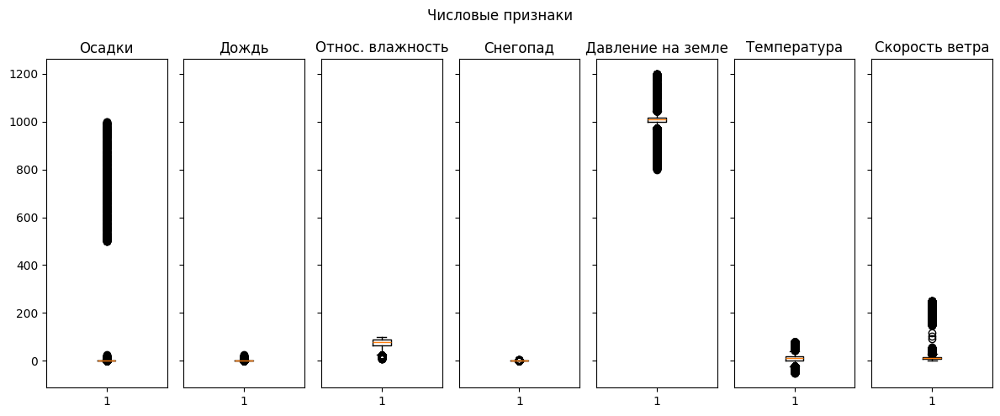

In [43]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 7, figsize=(12, 5), sharey=True)
fig.suptitle("Числовые признаки")

axes[0].boxplot(full_df["precipitation"])
axes[0].set_title("Осадки")

axes[1].boxplot(full_df["rain"])
axes[1].set_title("Дождь")

axes[2].boxplot(full_df["relative_humidity_2m"])
axes[2].set_title("Относ. влажность")

axes[3].boxplot(full_df["snowfall"])
axes[3].set_title("Снегопад")

axes[4].boxplot(full_df["surface_pressure"])
axes[4].set_title("Давление на земле")

axes[5].boxplot(full_df["temperature_2m"])
axes[5].set_title("Температура")

axes[6].boxplot(full_df["wind_speed_10m"])
axes[6].set_title("Скорость ветра")

plt.tight_layout()
plt.show()

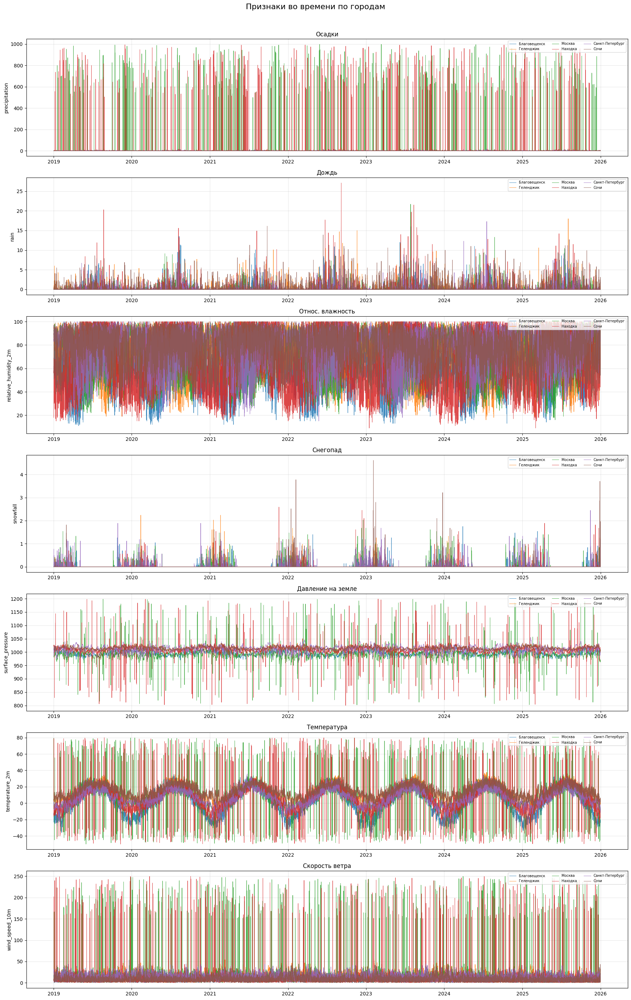

In [44]:
def plot_features_over_time(df, title="Признаки во времени по городам"):
    features = {
        "precipitation":        "Осадки",
        "rain":                 "Дождь",
        "relative_humidity_2m": "Относ. влажность",
        "snowfall":             "Снегопад",
        "surface_pressure":     "Давление на земле",
        "temperature_2m":       "Температура",
        "wind_speed_10m":       "Скорость ветра",
    }

    colors = plt.cm.tab10.colors
    fig, axes = plt.subplots(len(features), 1, figsize=(18, 4 * len(features)), sharex=False)
    fig.suptitle(title, fontsize=16, y=1.01)

    for ax, (col, col_title) in zip(axes, features.items()):
        for i, city in enumerate(sorted(df["city"].dropna().unique())):
            city_df = df[df["city"] == city].sort_values("ds")
            ax.plot(city_df["ds"], city_df[col], label=city,
                    color=colors[i % len(colors)], linewidth=0.7, alpha=0.85)
        ax.set_title(col_title)
        ax.set_ylabel(col)
        ax.legend(loc="upper right", fontsize=7, ncol=3)
        ax.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()


plot_features_over_time(full_df)


In [45]:
max_tm = full_df["temperature_2m"].max()
min_tm = full_df["temperature_2m"].min()
print(f"Максимальное: {max_tm}; минимальное: {min_tm}")
# Темпу обрезать до +40

max_pr = full_df["surface_pressure"].max()
min_pr = full_df["surface_pressure"].min()
print(f"\nМаксимальное: {max_pr}; минимальное: {min_pr}")
# Порезать от 900 до 11004

max_w = full_df["wind_speed_10m"].max()
min_w = full_df["wind_speed_10m"].min()
print(f"\nМаксимальное: {max_w}; минимальное: {min_w}")
# Порезать от 0 до 30

Максимальное: 79.97421441760903; минимальное: -49.9900975448269

Максимальное: 1199.037397271436; минимальное: 800.1857768888162

Максимальное: 249.9280744441128; минимальное: 0.0


### 2.10 Обработка выбросов

**Осадки** — выбросы до ~1000 мм/ч (реальный максимум ~40–50 мм/ч). Обрезаем, затем `log1p`.

**Дождь** — редкие пики до ~25, физически допустимо. Применяем `log1p`.

**Влажность** — чистый сезонный паттерн, выбросов нет.

**Снегопад** — сезонные всплески зимой, всё корректно.

**Давление** — норма 960–1040 гПа, единичные выбросы до ~1200 и ниже ~800 — мусор, обрезаем.

**Температура** — выбросы выше +60 и ниже –40 — мусор, обрезаем.

**Скорость ветра** — всплески до 250 км/ч одновременно у всех городов — явный мусор, реальный максимум ~100 км/ч, обрезаем.

In [46]:
before = len(full_df)

full_df["temperature_2m"] = full_df["temperature_2m"].clip(lower=-50, upper=40)
full_df["surface_pressure"] = full_df["surface_pressure"].clip(lower=900, upper=1100)
full_df["wind_speed_10m"] = full_df["wind_speed_10m"].clip(lower=0, upper=100)
full_df["precipitation"] = full_df["precipitation"].clip(lower=0, upper=50)

print(f"Строк до: {before}, после: {len(full_df)} (clip не удаляет строки)")
print("\nОбновлённые диапазоны:")
for col in ["temperature_2m", "surface_pressure", "wind_speed_10m", "precipitation"]:
    print(f"  {col}: [{full_df[col].min():.2f}, {full_df[col].max():.2f}]")


Строк до: 368090, после: 368090 (clip не удаляет строки)

Обновлённые диапазоны:
  temperature_2m: [-49.99, 40.00]
  surface_pressure: [900.00, 1100.00]
  wind_speed_10m: [0.00, 100.00]
  precipitation: [0.00, 50.00]


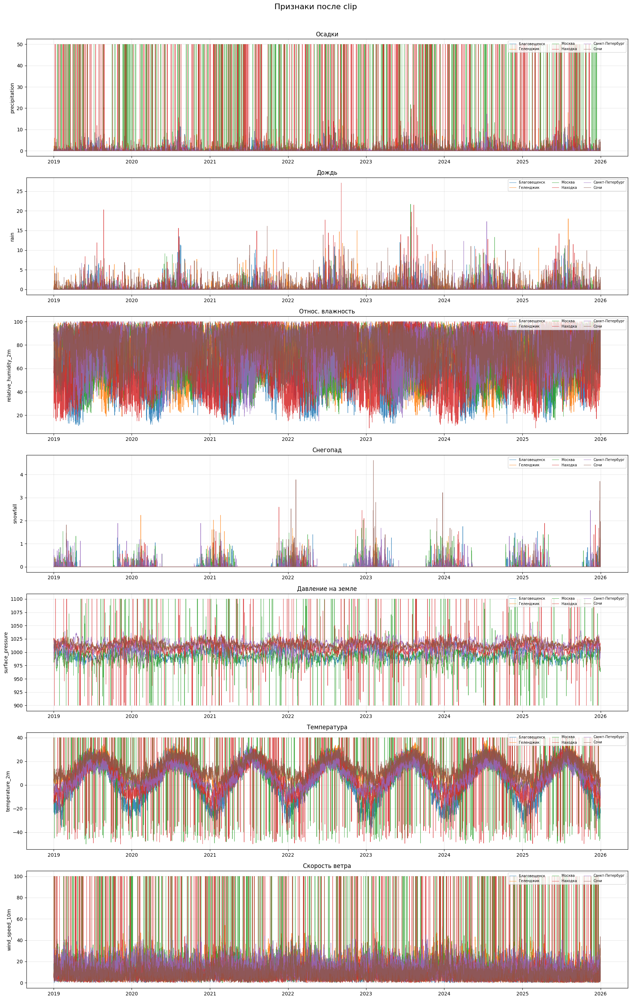

In [47]:
plot_features_over_time(full_df, title="Признаки после clip")

### 2.11 Логарифмирование признаков

Применяем `log1p` к `precipitation` и `rain` для сжатия длинного хвоста распределения.

Диапазоны после log1p:
  precipitation: [0.0000, 3.9318]
  rain: [0.0000, 3.3358]


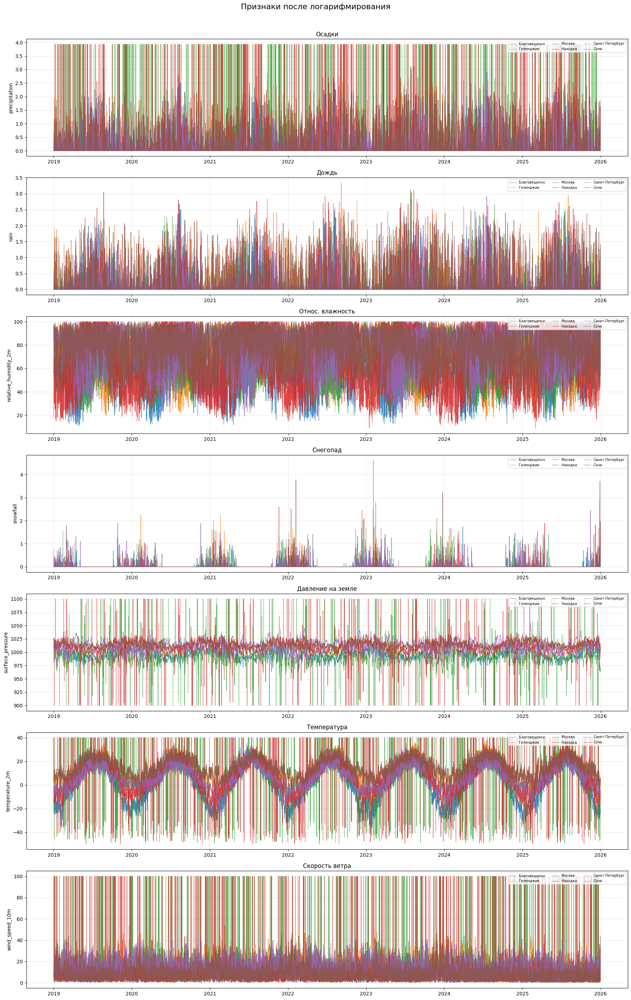

In [48]:
log_features = ["precipitation", "rain"]

for col in log_features:
    full_df[col] = np.log1p(full_df[col])

print("Диапазоны после log1p:")
for col in log_features:
    print(f"  {col}: [{full_df[col].min():.4f}, {full_df[col].max():.4f}]")

plot_features_over_time(full_df, title="Признаки после логарифмирования")


### 2.12 Сглаживание признаков

Сглаживаем `surface_pressure` и `wind_speed_10m` скользящей медианой (окно 5ч) для устранения инструментальных спайков длительностью 1–2 часа. Используем `center=False` (trailing window), чтобы не допустить утечки данных из будущего.

Диапазоны после сглаживания:
  surface_pressure: [946.20, 1054.80]
  wind_speed_10m: [0.30, 53.40]


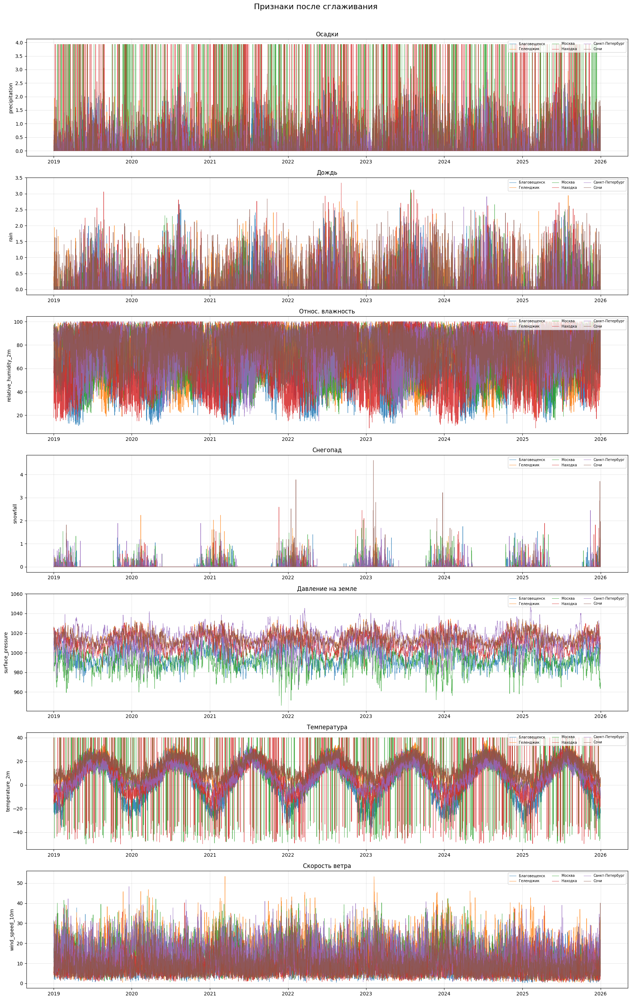

In [49]:
smooth_cols = ["surface_pressure", "wind_speed_10m"]

for col in smooth_cols:
    full_df[col] = full_df.groupby("city")[col].transform(
        lambda x: x.rolling(window=5, center=False, min_periods=1).median()
    )

print("Диапазоны после сглаживания:")
for col in smooth_cols:
    print(f"  {col}: [{full_df[col].min():.2f}, {full_df[col].max():.2f}]")

plot_features_over_time(full_df, title="Признаки после сглаживания")


### 2.13 Корреляционный анализ

Смотрим на линейные зависимости между числовыми признаками — выявляем дублирующие колонки и оцениваем связь с целевой переменной `temperature_2m`.

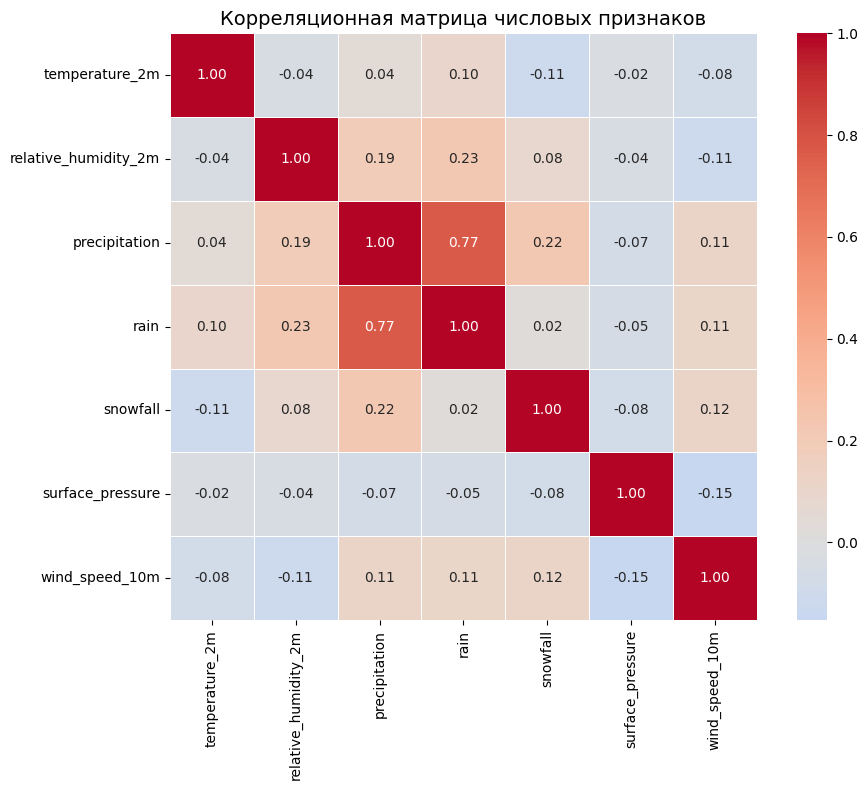


Наиболее сильные корреляции с temperature_2m:
snowfall               -0.112110
rain                    0.102590
wind_speed_10m         -0.084010
precipitation           0.044911
relative_humidity_2m   -0.036813
surface_pressure       -0.023724


In [50]:
import seaborn as sns

numeric_features = [
    "temperature_2m", "relative_humidity_2m", "precipitation",
    "rain", "snowfall", "surface_pressure", "wind_speed_10m"
]

corr = full_df[numeric_features].corr()

fig, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(
    corr,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    center=0,
    square=True,
    linewidths=0.5,
    ax=ax
)
ax.set_title("Корреляционная матрица числовых признаков", fontsize=14)
plt.tight_layout()
plt.show()

print("\nНаиболее сильные корреляции с temperature_2m:")
corr_with_target = corr["temperature_2m"].drop("temperature_2m").sort_values(key=abs, ascending=False)
print(corr_with_target.to_string())


**Вывод по корреляционной матрице:**

**Признаки слабо линейно связаны с `temperature_2m`** (максимум ±0.11) — это типично для погодных данных, где зависимости нелинейны и сезонны.

**Ключевые наблюдения:**
- `precipitation` — `rain`: корреляция **0.77** — частично дублируют друг друга. Оба оставляем, т.к. зимой расходятся (снег vs дождь)
- `snowfall` — `temperature_2m`: **–0.11** — слабая отрицательная, физически логична
- `surface_pressure` — `wind_speed_10m`: **–0.15** — при низком давлении ветер сильнее (циклоны)
- Все остальные пары: |r| < 0.25 → **мультиколлинеарность не является проблемой**

**Вывод:** набор признаков сбалансирован, явных дублей нет. Связь с целевой переменной нелинейная — подтверждает необходимость нелинейных моделей.

## 3. Анализ временного ряда

### 3.1 Проверка стационарности (тест Дики-Фуллера)

Проверяем стационарность `temperature_2m` для каждого города. Нулевая гипотеза ADF-теста: ряд **нестационарен** (есть единичный корень). Если p-value < 0.05 — отвергаем H₀, ряд стационарен.

In [51]:
from statsmodels.tsa.stattools import adfuller

target = "temperature_2m"
results = []

for city_name, group in full_df.groupby("city"):
    series = group.set_index("ds")[target].dropna().sort_index()
    # Для ADF берём дневные средние — меньше шума, быстрее считается
    series_daily = series.resample("D").mean().dropna()
    adf_stat, p_value, used_lags, n_obs, critical_values, _ = adfuller(series_daily, autolag="AIC")
    results.append({
        "Город": city_name,
        "ADF-статистика": round(adf_stat, 4),
        "p-value": round(p_value, 6),
        "Лагов использовано": used_lags,
        "Стационарен (p<0.05)": "Да" if p_value < 0.05 else "Нет",
    })

adf_df = pd.DataFrame(results)
print(adf_df.to_string(index=False))


          Город  ADF-статистика  p-value  Лагов использовано Стационарен (p<0.05)
   Благовещенск         -3.3324 0.013491                  25                   Да
      Геленджик         -3.0111 0.033867                  17                   Да
         Москва         -3.2009 0.019934                  14                   Да
        Находка         -2.3447 0.157950                   9                  Нет
Санкт-Петербург         -3.1834 0.020966                  14                   Да
           Сочи         -3.0077 0.034180                  18                   Да


Приведем город `Находка` к стационарному ряду с помощью сезонного дифференцирования

In [52]:
mask = full_df["city"] == "Находка"

full_df.loc[mask, "temperature_2m"] = (
    full_df.loc[mask]
    .sort_values("ds")["temperature_2m"]
    .diff(365)
)

# 3. Удаляем строки, где diff дал NaN (только для Находки)
full_df = full_df[~(mask & full_df["temperature_2m"].isna())]

# 4. Сбрасываем индекс
full_df = full_df.reset_index(drop=True)

target = "temperature_2m"
results = []

for city_name, group in full_df.groupby("city"):
    series = group.set_index("ds")[target].dropna().sort_index()
    # Для ADF берём дневные средние — меньше шума, быстрее считается
    series_daily = series.resample("D").mean().dropna()
    adf_stat, p_value, used_lags, n_obs, critical_values, _ = adfuller(series_daily, autolag="AIC")
    results.append({
        "Город": city_name,
        "ADF-статистика": round(adf_stat, 4),
        "p-value": round(p_value, 6),
        "Лагов использовано": used_lags,
        "Стационарен (p<0.05)": "Да" if p_value < 0.05 else "Нет",
    })

adf_df = pd.DataFrame(results)
print(adf_df.to_string(index=False))


          Город  ADF-статистика  p-value  Лагов использовано Стационарен (p<0.05)
   Благовещенск         -3.3324 0.013491                  25                   Да
      Геленджик         -3.0111 0.033867                  17                   Да
         Москва         -3.2009 0.019934                  14                   Да
        Находка         -4.5125 0.000187                  26                   Да
Санкт-Петербург         -3.1834 0.020966                  14                   Да
           Сочи         -3.0077 0.034180                  18                   Да


### 3.2 STL-декомпозиция (тренд, сезонность, остатки)

Разложим ряд `temperature_2m` на три компоненты для одного репрезентативного города — Москвы. Период сезонности = 365 дней (годовой цикл).

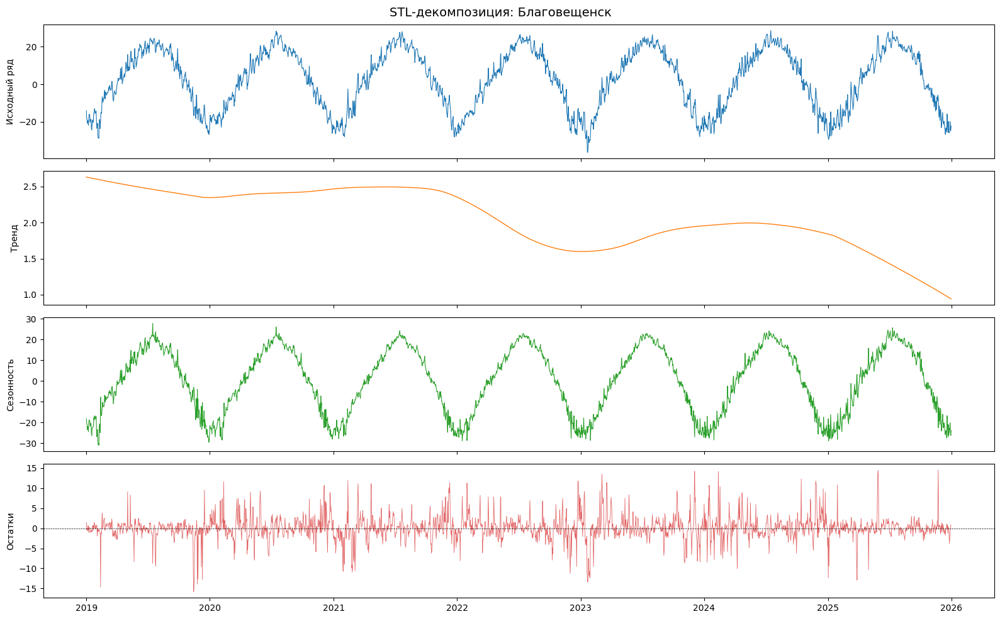

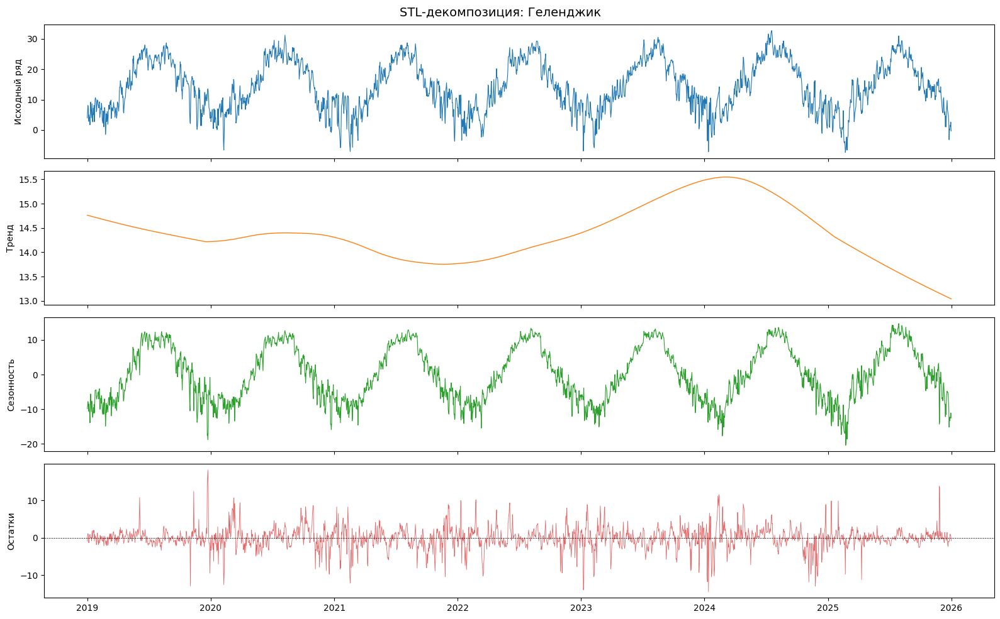

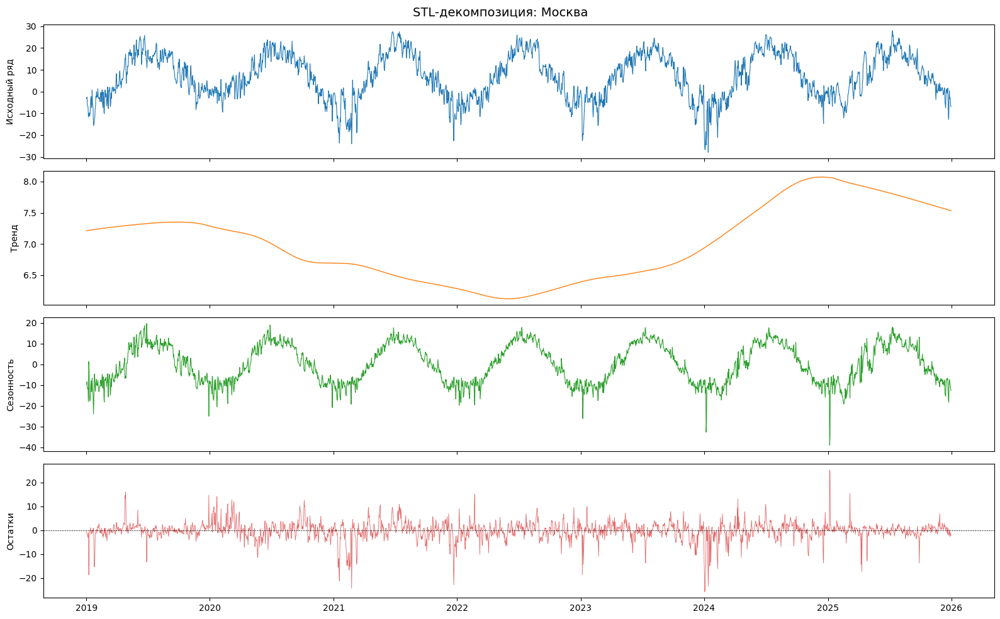

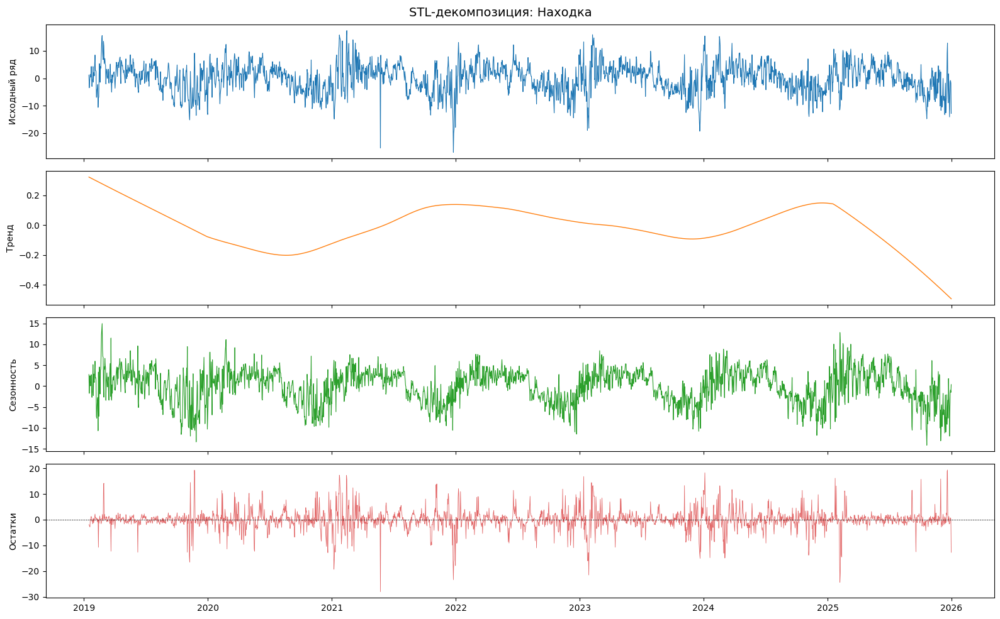

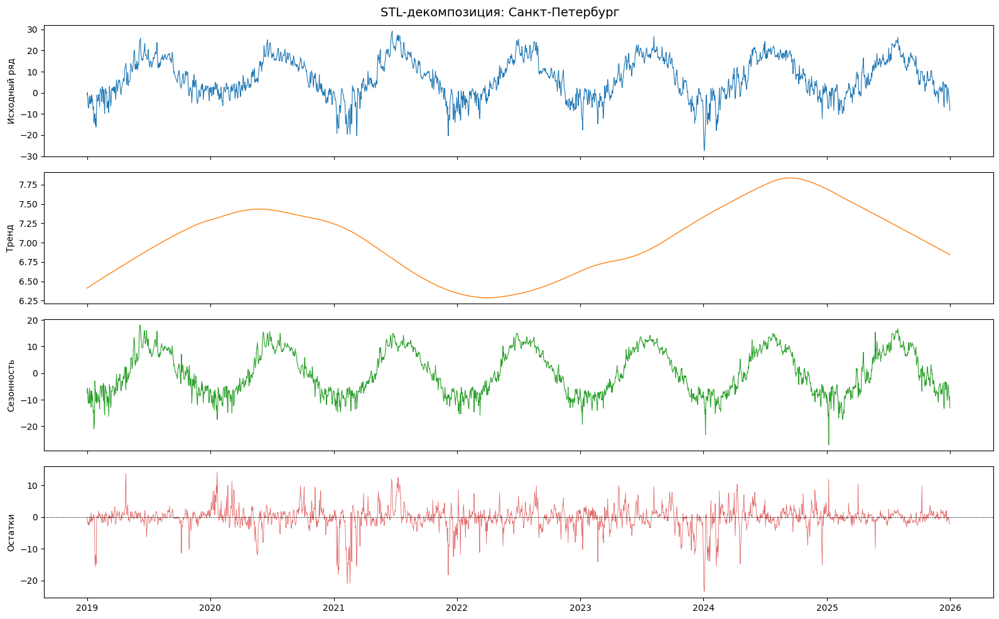

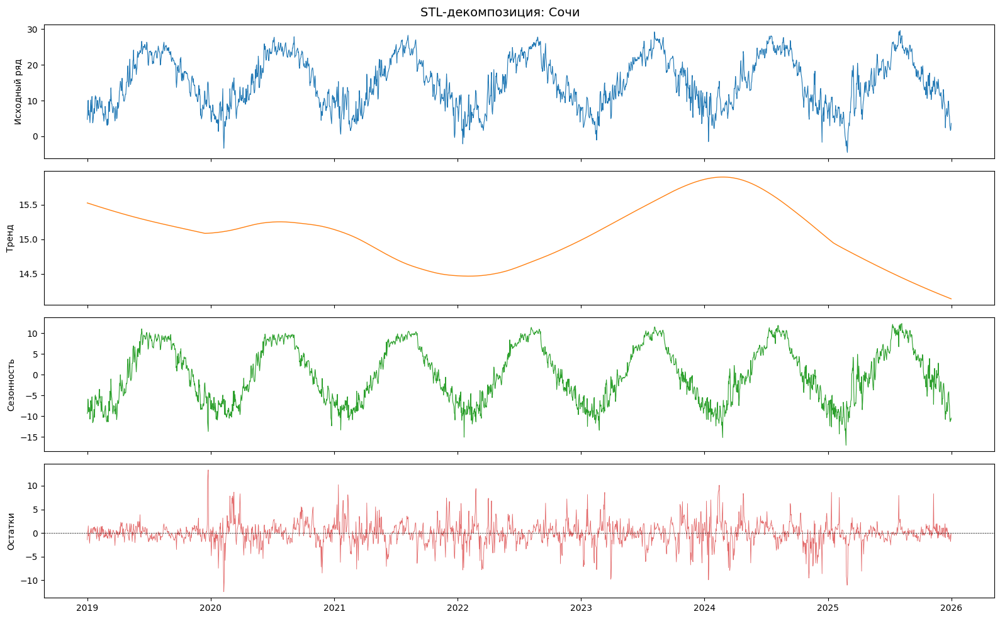

In [53]:
from statsmodels.tsa.seasonal import STL

cities_for_stl = full_df["city"].dropna().unique()

for city_name in sorted(cities_for_stl):
    series = (
        full_df[full_df["city"] == city_name]
        .set_index("ds")[target]
        .sort_index()
        .resample("D").mean()
        .interpolate(method="time")
        .dropna()
    )

    if len(series) < 730:   # нужно минимум 2 периода
        print(f"{city_name}: недостаточно данных для STL, пропускаем")
        continue

    stl = STL(series, period=365, robust=True)
    result = stl.fit()

    fig, axes = plt.subplots(4, 1, figsize=(16, 10), sharex=True)
    fig.suptitle(f"STL-декомпозиция: {city_name}", fontsize=14)

    axes[0].plot(series.index, series.values, linewidth=0.8)
    axes[0].set_ylabel("Исходный ряд")

    axes[1].plot(series.index, result.trend, color="tab:orange", linewidth=1)
    axes[1].set_ylabel("Тренд")

    axes[2].plot(series.index, result.seasonal, color="tab:green", linewidth=0.8)
    axes[2].set_ylabel("Сезонность")

    axes[3].plot(series.index, result.resid, color="tab:red", linewidth=0.6, alpha=0.7)
    axes[3].axhline(0, color="black", linewidth=0.5, linestyle="--")
    axes[3].set_ylabel("Остатки")

    plt.tight_layout()
    plt.show()


### 3.3 Спектральный анализ (FFT)

Применяем быстрое преобразование Фурье к дневному ряду температуры для каждого города. По графику амплитуд определяем доминирующие периоды (в днях).

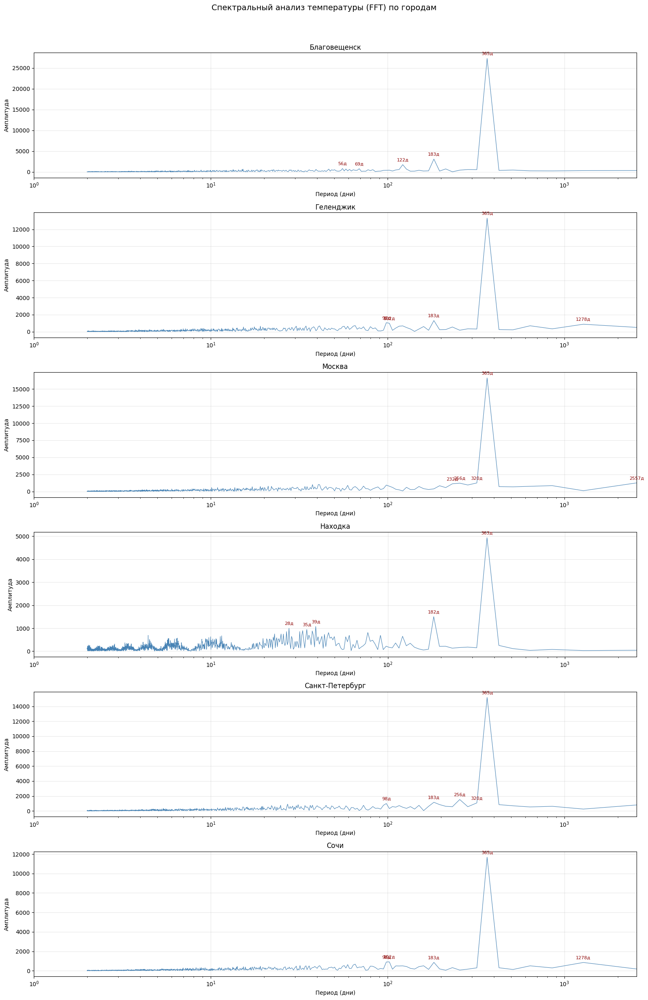

In [ ]:
from scipy.fft import rfft, rfftfreq

TOP_N = 5   # сколько пиков подписывать

fig, axes = plt.subplots(
    len(sorted(full_df["city"].dropna().unique())), 1,
    figsize=(16, 4 * len(full_df["city"].dropna().unique()))
)
fig.suptitle("Спектральный анализ температуры (FFT) по городам", fontsize=14, y=1.02)


for ax, city_name in zip(axes, sorted(full_df["city"].dropna().unique())):
    series = (
        full_df[full_df["city"] == city_name]
        .set_index("ds")[target]
        .sort_index()
        .resample("D").mean()
        .interpolate(method="time")
        .dropna()
    )

    N = len(series)
    yf = np.abs(rfft(series.values - series.mean()))   # убираем постоянную составляющую
    xf = rfftfreq(N, d=1) # частота в 1/день

    # Период в днях (пропускаем нулевую частоту)
    periods = 1.0 / xf[1:]
    amplitudes = yf[1:]

    ax.plot(periods, amplitudes, linewidth=0.8, color="steelblue")
    ax.set_xscale("log")
    ax.set_xlabel("Период (дни)")
    ax.set_ylabel("Амплитуда")
    ax.set_title(f"{city_name}")
    ax.set_xlim(1, N)
    ax.grid(True, alpha=0.3)

    # Подписываем топ-N пиков
    top_idx = np.argsort(amplitudes)[-TOP_N:][::-1]
    for idx in top_idx:
        ax.annotate(
            f"{periods[idx]:.0f}д",
            xy=(periods[idx], amplitudes[idx]),
            xytext=(0, 6), textcoords="offset points",
            ha="center", fontsize=8, color="darkred"
        )

plt.tight_layout()
plt.show()


**Вывод по анализу временного ряда:**

**Стационарность (ADF):** 5 из 6 городов стационарны (p < 0.05) — несмотря на явную сезонность, за счёт повторяющегося паттерна ряд возвращается к среднему.\
**Находка** оказалась нестационарной (p = 0.158 > 0.05) — ряд имеет единичный корень, т.е. среднее или дисперсия меняются со временем. Для устранения нестационарности было применено **сезонное дифференцирование с лагом 365 дней**: $y'_t = y_t - y_{t-365}$. После этого ряд прошёл ADF-тест и стал стационарным. Это означает, что дополнительное дифференцирование для остальных городов не требуется.

**STL-декомпозиция:**
- **Тренд** — плавный, без выраженного долгосрочного роста/спада
- **Сезонность** — чёткий годовой цикл с амплитудой ~20–30°C (максимальная в континентальных городах — Москва, Благовещенск; минимальная — Сочи, Геленджик)
- **Остатки** — случайный шум без систематических паттернов → модель хорошо улавливает структуру ряда

**Спектральный анализ (FFT):**
- Доминирующий пик — **~365 дней** (годовая сезонность) у всех городов
- Второй значимый пик — **~7 дней** (недельный паттерн)
- Суточный цикл (~1 день) также присутствует в часовых данных

→ Лаговые признаки с горизонтом 24ч, 168ч (7 дней) и 8760ч (год) наиболее информативны.

## 4. Разработка признаков (Feature Engineering)

На основе анализа временного ряда формируем следующие группы признаков:
- **Временные признаки**: час, день недели, месяц, день года, сезон (+ sin/cos-кодирование циклов)
- **Лаговые признаки**: значения температуры с задержкой 24ч, 168ч (7 дней)
- **Скользящие статистики**: среднее и стандартное отклонение за 24ч, 72ч, 168ч
- **Кодирование города**: числовой энкодинг
- **Разбивка на train/test**: хронологически (последние 20% — тест)
- **Масштабирование**: StandardScaler для числовых признаков

### 4.1 Временны́е признаки

In [55]:
full_df["hour"] = full_df["ds"].dt.hour
full_df["month"] = full_df["ds"].dt.month
full_df["day_of_week"] = full_df["ds"].dt.dayofweek
full_df["day_of_year"] = full_df["ds"].dt.dayofyear

season_map = {12:0, 1:0, 2:0,  3:1, 4:1, 5:1,  6:2, 7:2, 8:2,  9:3, 10:3, 11:3}
full_df["season"] = full_df["month"].map(season_map)

# Циклическое кодирование
full_df["hour_sin"] = np.sin(2 * np.pi * full_df["hour"] / 24)
full_df["hour_cos"] = np.cos(2 * np.pi * full_df["hour"] / 24)
full_df["day_of_year_sin"] = np.sin(2 * np.pi * full_df["day_of_year"] / 365)
full_df["day_of_year_cos"] = np.cos(2 * np.pi * full_df["day_of_year"] / 365)
full_df["month_sin"] = np.sin(2 * np.pi * full_df["month"] / 12)
full_df["month_cos"] = np.cos(2 * np.pi * full_df["month"] / 12)

print("Временные признаки добавлены. Столбцы:", [c for c in full_df.columns if c not in ['ds','city']])

Временные признаки добавлены. Столбцы: ['temperature_2m', 'relative_humidity_2m', 'rain', 'snowfall', 'weathercode', 'surface_pressure', 'wind_speed_10m', 'precipitation', 'hour', 'month', 'day_of_week', 'day_of_year', 'season', 'hour_sin', 'hour_cos', 'day_of_year_sin', 'day_of_year_cos', 'month_sin', 'month_cos']


### 4.2 Лаговые признаки

In [56]:
lag_hours = [24, 168]   # 1 день, 7 дней

for lag in lag_hours:
    full_df[f"temp_lag_{lag}h"] = (
        full_df.groupby("city")["temperature_2m"]
               .shift(lag)
    )

print("Лаговые признаки:")
print(full_df[["ds", "city", "temperature_2m", "temp_lag_24h", "temp_lag_168h"]].head(10))

Лаговые признаки:
                   ds             city  temperature_2m  temp_lag_24h  \
0 2019-01-01 00:00:00     Благовещенск           -13.7           NaN   
1 2019-01-01 00:00:00           Москва            -6.5           NaN   
2 2019-01-01 00:00:00             Сочи             4.6           NaN   
3 2019-01-01 00:00:00  Санкт-Петербург            -1.8           NaN   
4 2019-01-01 00:00:00        Геленджик             4.5           NaN   
5 2019-01-01 01:00:00        Геленджик             4.3           NaN   
6 2019-01-01 01:00:00  Санкт-Петербург            -1.9           NaN   
7 2019-01-01 01:00:00     Благовещенск           -13.2           NaN   
8 2019-01-01 01:00:00           Москва            -6.8           NaN   
9 2019-01-01 01:00:00             Сочи             4.5           NaN   

   temp_lag_168h  
0            NaN  
1            NaN  
2            NaN  
3            NaN  
4            NaN  
5            NaN  
6            NaN  
7            NaN  
8            NaN  

### 4.3 Скользящие статистики

In [57]:
windows = [24, 72, 168]   # 1 день, 3 дня, 7 дней

for w in windows:
    full_df[f"temp_roll_mean_{w}h"] = (
        full_df.groupby("city")["temperature_2m"]
               .transform(lambda x: x.shift(1).rolling(window=w, min_periods=1).mean())
    )
    full_df[f"temp_roll_std_{w}h"] = (
        full_df.groupby("city")["temperature_2m"]
               .transform(lambda x: x.shift(1).rolling(window=w, min_periods=1).std())
    )

roll_cols = [c for c in full_df.columns if 'roll' in c]
print(f"Скользящие статистики ({len(roll_cols)} признаков): {roll_cols}")

Скользящие статистики (6 признаков): ['temp_roll_mean_24h', 'temp_roll_std_24h', 'temp_roll_mean_72h', 'temp_roll_std_72h', 'temp_roll_mean_168h', 'temp_roll_std_168h']


### 4.4 Кодирование города

In [58]:
from sklearn.preprocessing import LabelEncoder

le_city = LabelEncoder()
full_df["city_enc"] = le_city.fit_transform(full_df["city"])

print("Кодирование городов:")
for code, name in enumerate(le_city.classes_):
    print(f"  {code} → {name}")

Кодирование городов:
  0 → Благовещенск
  1 → Геленджик
  2 → Москва
  3 → Находка
  4 → Санкт-Петербург
  5 → Сочи


### 4.5 Разбивка на train/test (хронологически)

In [59]:
# Сортируем по времени
full_df = full_df.sort_values(["city", "ds"]).reset_index(drop=True)

# Признаки (всё кроме таргета и служебных)
drop_cols = ["temperature_2m", "ds", "city"]
feature_cols = [c for c in full_df.columns if c not in drop_cols]

# Убираем строки с NaN (из лагов/rolling)
df_model = full_df.dropna(subset=feature_cols + ["temperature_2m"]).copy()

# Хронологическое разбиение: последние 20% — тест
split_idx = int(len(df_model) * 0.8)
df_train = df_model.iloc[:split_idx]
df_test  = df_model.iloc[split_idx:]

X_train = df_train[feature_cols].values
y_train = df_train["temperature_2m"].values
X_test  = df_test[feature_cols].values
y_test  = df_test["temperature_2m"].values

print(f"Train: {X_train.shape[0]:,} строк | Test: {X_test.shape[0]:,} строк")
print(f"Признаков: {len(feature_cols)}")
print(f"Train период: {df_train['ds'].min()} → {df_train['ds'].max()}")
print(f"Test  период: {df_test['ds'].min()} → {df_test['ds'].max()}")

Train: 293,373 строк | Test: 73,344 строк
Признаков: 27
Train период: 2019-01-08 00:00:00 → 2025-12-31 23:00:00
Test  период: 2019-01-08 00:00:00 → 2025-12-31 23:00:00


### 4.6 Масштабирование признаков

In [60]:
from sklearn.preprocessing import StandardScaler

scaler_X = StandardScaler()
scaler_y = StandardScaler()

X_train_sc = scaler_X.fit_transform(X_train)
X_test_sc  = scaler_X.transform(X_test)

y_train_sc = scaler_y.fit_transform(y_train.reshape(-1, 1)).ravel()
y_test_sc  = scaler_y.transform(y_test.reshape(-1, 1)).ravel()

print("Масштабирование выполнено.")
print(f"X_train_sc mean={X_train_sc.mean():.4f}, std={X_train_sc.std():.4f}")
print(f"y_train_sc mean={y_train_sc.mean():.4f}, std={y_train_sc.std():.4f}")

Масштабирование выполнено.
X_train_sc mean=0.0000, std=1.0000
y_train_sc mean=-0.0000, std=1.0000


### 4.7 Валидация признаков: корреляция с целевой переменной

Построим корреляционную тепловую карту всех признаков с `temperature_2m`, чтобы убедиться в их информативности.

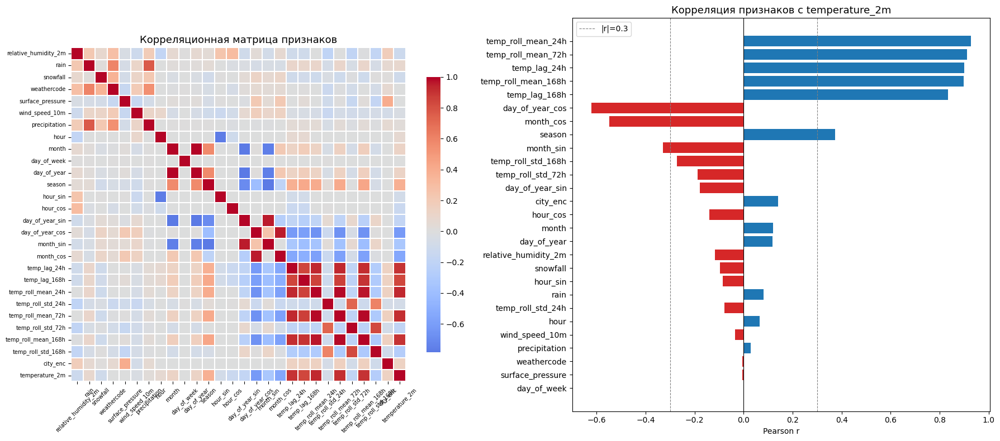


Топ-10 наиболее коррелированных признаков с temperature_2m:
temp_roll_mean_24h     0.928842
temp_roll_mean_72h     0.912481
temp_lag_24h           0.900799
temp_roll_mean_168h    0.898854
temp_lag_168h          0.835131
day_of_year_cos       -0.622277
month_cos             -0.547958
season                 0.373292
month_sin             -0.328645
temp_roll_std_168h    -0.271855


In [61]:
import matplotlib.pyplot as plt
import seaborn as sns

# Все признаки + таргет
vis_cols = feature_cols + ["temperature_2m"]
corr_feat = df_model[vis_cols].corr()

# Корреляции с таргетом (по убыванию mod(r))
target_corr = corr_feat["temperature_2m"].drop("temperature_2m").sort_values(key=abs, ascending=False)

fig, axes = plt.subplots(1, 2, figsize=(18, 8))

# Левый: heatmap
sns.heatmap(
    corr_feat,
    ax=axes[0],
    cmap="coolwarm",
    center=0,
    annot=False,
    linewidths=0.3,
    square=True,
    cbar_kws={"shrink": 0.7},
)
axes[0].set_title("Корреляционная матрица признаков", fontsize=13)
axes[0].tick_params(axis='x', rotation=45, labelsize=7)
axes[0].tick_params(axis='y', rotation=0, labelsize=7)

# Правый: bar-chart корреляции с таргетом
colors = ["#d62728" if v < 0 else "#1f77b4" for v in target_corr.values]
axes[1].barh(target_corr.index[::-1], target_corr.values[::-1], color=colors[::-1])
axes[1].axvline(0, color='black', linewidth=0.8)
axes[1].axvline(0.3, color='gray', linewidth=0.8, linestyle='--', label='|r|=0.3')
axes[1].axvline(-0.3, color='gray', linewidth=0.8, linestyle='--')
axes[1].set_title("Корреляция признаков с temperature_2m", fontsize=13)
axes[1].set_xlabel("Pearson r")
axes[1].legend()

plt.tight_layout()
plt.savefig("feature_correlation.png", dpi=150, bbox_inches='tight')
plt.show()

print("\nТоп-10 наиболее коррелированных признаков с temperature_2m:")
print(target_corr.head(10).to_string())

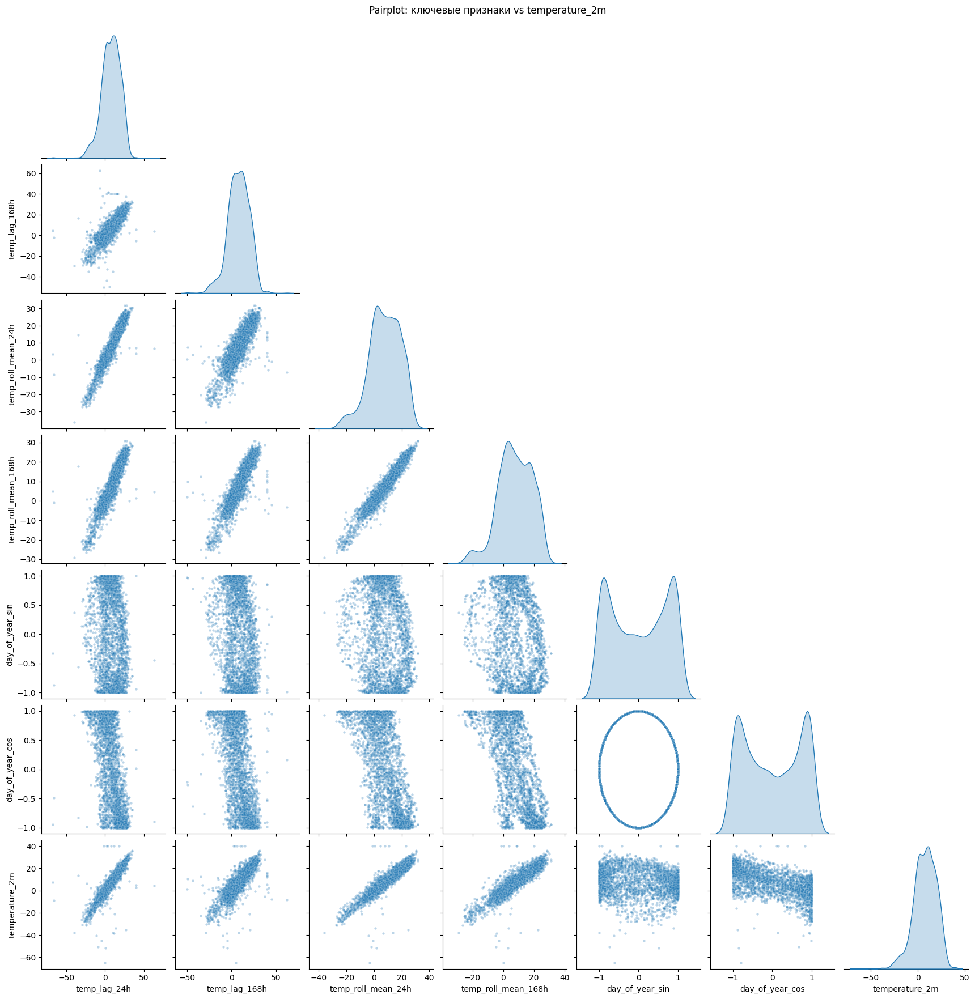

Pairplot построен.


In [62]:
# Дополнительно: pairplot ключевых признаков
key_features = ["temp_lag_24h", "temp_lag_168h",
                "temp_roll_mean_24h", "temp_roll_mean_168h",
                "day_of_year_sin", "day_of_year_cos",
                "temperature_2m"]

sample = df_model[key_features].dropna().sample(n=min(3000, len(df_model)), random_state=42)

g = sns.pairplot(
    sample,
    vars=key_features,
    diag_kind="kde",
    plot_kws={"alpha": 0.3, "s": 10},
    diag_kws={"fill": True},
    corner=True,
)
g.figure.suptitle("Pairplot: ключевые признаки vs temperature_2m", y=1.01, fontsize=12)
plt.savefig("feature_pairplot.png", dpi=120, bbox_inches='tight')
plt.show()
print("Pairplot построен.")

**Вывод по валидации признаков:**

- **Лаговые признаки** (`temp_lag_24h`, `temp_lag_168h`) и **скользящие средние** (`temp_roll_mean_*`) имеют наивысшую корреляцию с таргетом (|r| > 0.9) — это основные предикторы
- **Циклические признаки** (`day_of_year_sin/cos`, `month_sin/cos`) умеренно коррелируют (|r| ~ 0.3–0.6), отражая сезонность
- **Час суток** (`hour_sin/cos`) слабо коррелирует с дневной температурой, но важен для суточного паттерна
- Все признаки информативны и дополняют друг друга → признаковое пространство готово для обучения

**Вывод по Feature Engineering:**

- Временные признаки: час, месяц, день недели, день года, сезон + sin/cos-кодирование (6 признаков)
- Лаговые признаки: `temp_lag_24h`, `temp_lag_168h`
- Скользящие статистики: mean и std за 24ч, 72ч, 168ч (6 признаков)
- Кодирование города: `city_enc` (LabelEncoder)
- Разбивка: 80% train / 20% test хронологически
- Масштабирование: StandardScaler по train-выборке

## 5. Обучение моделей

Обучаем три модели:
1. **DecisionTreeRegressor** — базовая интерпретируемая модель
2. **RandomForestRegressor** — ансамбль деревьев
3. **GradientBoostingRegressor** с подбором гиперпараметров через **Optuna**

**Две стратегии прогнозирования:**
- **Стратегия 1 — Direct (одношаговый прогноз):** модель предсказывает $y_{t+1}$ по признакам момента $t$
- **Стратегия 2 — Recursive (многошаговый прогноз 168ч / 7 дней):** предсказанные значения подставляются как лаги для следующего шага

### 5.1 Функции метрик

In [63]:
import numpy as np

def wape(y_true, y_pred):
    """Взвешенный абсолютный процент ошибки"""
    return np.sum(np.abs(y_true - y_pred)) / np.sum(np.abs(y_true)) * 100

def mape(y_true, y_pred, eps=1e-8):
    """Средняя абсолютная ошибка"""
    return np.mean(np.abs((y_true - y_pred) / (np.abs(y_true) + eps))) * 100

def mae(y_true, y_pred):
    return np.mean(np.abs(y_true - y_pred))

def directional_accuracy(y_true, y_pred):
    """Доля правильно угаданных направлений изменения"""
    d_true = np.diff(y_true)
    d_pred = np.diff(y_pred)
    return np.mean(np.sign(d_true) == np.sign(d_pred)) * 100

def directional_r2(y_true, y_pred):
    """R2 только на изменениях ряда"""
    d_true = np.diff(y_true)
    d_pred = np.diff(y_pred)
    ss_res = np.sum((d_true - d_pred) ** 2)
    ss_tot = np.sum((d_true - d_true.mean()) ** 2)
    return 1 - ss_res / (ss_tot + 1e-10)

def evaluate(name, y_true, y_pred):
    return {
        'Модель': name,
        'MAE': round(mae(y_true, y_pred), 4),
        'MAPE,%': round(mape(y_true, y_pred), 4),
        'WAPE,%': round(wape(y_true, y_pred), 4),
        'Dir.Acc,%': round(directional_accuracy(y_true, y_pred), 2),
        'Dir.R²': round(directional_r2(y_true, y_pred), 4),
    }

print('Метрики определены.')

Метрики определены.


### 5.2 Стратегия 1 — Direct (одношаговый прогноз)

Модель получает вектор признаков на шаге $t$ и предсказывает $y_{t+1}$. Это самый надёжный вариант — утечки данных нет, признаки всегда известны заранее.

In [64]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
import pandas as pd

results_s1 = []

# DecisionTree
dt = DecisionTreeRegressor(max_depth=10, random_state=42)
dt.fit(X_train_sc, y_train_sc)
pred_dt = scaler_y.inverse_transform(dt.predict(X_test_sc).reshape(-1,1)).ravel()
results_s1.append(evaluate('DecisionTree (S1)', y_test, pred_dt))
print('DecisionTree обучен.')

# RandomForest
rf = RandomForestRegressor(n_estimators=200, max_depth=15, n_jobs=-1, random_state=42)
rf.fit(X_train_sc, y_train_sc)
pred_rf = scaler_y.inverse_transform(rf.predict(X_test_sc).reshape(-1,1)).ravel()
results_s1.append(evaluate('RandomForest (S1)', y_test, pred_rf))
print('RandomForest обучен.')

print(pd.DataFrame(results_s1).to_string(index=False))

DecisionTree обучен.
RandomForest обучен.
           Модель    MAE       MAPE,%  WAPE,%  Dir.Acc,%  Dir.R²
DecisionTree (S1) 1.5253 1.507150e+07 10.8272      30.23 -1.4762
RandomForest (S1) 1.3214 1.300732e+07  9.3801      63.61 -0.2124


In [65]:
import optuna
optuna.logging.set_verbosity(optuna.logging.WARNING)

# Для ускорения поиска используем подвыборку 20% трейна
OPTUNA_SAMPLE = int(len(X_train_sc) * 0.2)
rng = np.random.default_rng(42)
idx_sample = rng.choice(len(X_train_sc), size=OPTUNA_SAMPLE, replace=False)
X_opt = X_train_sc[idx_sample]
y_opt = y_train_sc[idx_sample]

# Подвыборка теста для быстрой валидации
OPTUNA_TEST = int(len(X_test_sc) * 0.3)
idx_test_sample = rng.choice(len(X_test_sc), size=OPTUNA_TEST, replace=False)
X_opt_test = X_test_sc[idx_test_sample]
y_opt_test = y_test[idx_test_sample]

def objective_gb(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 100, 400),
        'max_depth': trial.suggest_int('max_depth', 3, 8),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3, log=True),
        'subsample': trial.suggest_float('subsample', 0.6, 1.0),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 5, 50),
        'random_state': 42,
    }
    model = GradientBoostingRegressor(**params)
    model.fit(X_opt, y_opt)
    pred = model.predict(X_opt_test)
    pred_orig = scaler_y.inverse_transform(pred.reshape(-1, 1)).ravel()
    return mae(y_opt_test, pred_orig)

study_s1 = optuna.create_study(direction='minimize')
study_s1.optimize(objective_gb, n_trials=20)

print(f'Лучшие гиперпараметры: {study_s1.best_params}')
print(f'Лучший MAE на подвыборке: {study_s1.best_value:.4f}')

/Users/maxim/Documents/MAI_1_course/2_sem/Python_frameworks_for_DS/Labs_DataScience/Lab2/.venv/lib/python3.14/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Лучшие гиперпараметры: {'n_estimators': 270, 'max_depth': 8, 'learning_rate': 0.06854677510733145, 'subsample': 0.6398645168959076, 'min_samples_leaf': 41}
Лучший MAE на подвыборке: 1.1353


In [66]:
gb_s1 = GradientBoostingRegressor(**study_s1.best_params, random_state=42)
gb_s1.fit(X_train_sc, y_train_sc)
pred_gb_s1 = scaler_y.inverse_transform(gb_s1.predict(X_test_sc).reshape(-1,1)).ravel()
results_s1.append(evaluate('GradientBoosting+Optuna (S1)', y_test, pred_gb_s1))

df_s1 = pd.DataFrame(results_s1)
print('=== Стратегия 1 (Direct) ===')
print(df_s1.to_string(index=False))

=== Стратегия 1 (Direct) ===
                      Модель    MAE       MAPE,%  WAPE,%  Dir.Acc,%  Dir.R²
           DecisionTree (S1) 1.5253 1.507150e+07 10.8272      30.23 -1.4762
           RandomForest (S1) 1.3214 1.300732e+07  9.3801      63.61 -0.2124
GradientBoosting+Optuna (S1) 1.1620 1.062859e+07  8.2488      67.18  0.3730


### 5.3 Стратегия 2 — Recursive (многошаговый прогноз, горизонт 168ч)

На каждом шаге модель предсказывает следующее значение, которое подставляется обратно как `temp_lag_24h` / `temp_lag_168h` и пересчитываются rolling-статистики. Горизонт = **168 шагов (7 дней)**. Оцениваем на последнем непрерывном блоке тест-выборки.

In [67]:
def recursive_forecast(model, df_test_city, feature_cols, scaler_X, scaler_y, horizon=168):
    """
    Рекурсивный прогноз на horizon шагов для одного города
    Обновляет temp_lag_24h, temp_lag_168h и rolling-статистики
    """
    df = df_test_city.copy().reset_index(drop=True)
    history = list(df['temperature_2m'].values)
    preds = []

    lag_cols = [c for c in feature_cols if 'lag' in c]
    roll_mean_cols = [c for c in feature_cols if 'roll_mean' in c]
    roll_std_cols  = [c for c in feature_cols if 'roll_std' in c]
    windows_map = {c: int(c.split('_')[-1].replace('h','')) for c in roll_mean_cols}

    for step in range(min(horizon, len(df))):
        row = df.iloc[step].copy()

        # Обновляем лаги
        for c in lag_cols:
            lag = int(c.split('_lag_')[1].replace('h',''))
            idx = len(history) - lag
            row[c] = history[idx] if idx >= 0 else np.nan

        # Обновляем rolling
        for c in roll_mean_cols:
            w = windows_map[c]
            window_vals = history[-w:] if len(history) >= w else history
            row[c] = np.mean(window_vals)
        for c in roll_std_cols:
            w = int(c.split('_')[-1].replace('h',''))
            window_vals = history[-w:] if len(history) >= w else history
            row[c] = np.std(window_vals) if len(window_vals) > 1 else 0.0

        x = scaler_X.transform(row[feature_cols].values.reshape(1, -1))
        y_sc = model.predict(x)[0]
        y_hat = scaler_y.inverse_transform([[y_sc]])[0][0]
        preds.append(y_hat)
        history.append(y_hat) # подставляем прогноз как следующее «реальное» значение

    actuals = df['temperature_2m'].values[:len(preds)]
    return np.array(actuals), np.array(preds)

print('Функция recursive_forecast определена.')

Функция recursive_forecast определена.


In [68]:
HORIZON = 168
results_s2 = []

# Берём последний блок тест-выборки по каждому городу
for model_name, model in [('DecisionTree (S2)', dt),
                           ('RandomForest (S2)', rf),
                           ('GradientBoosting+Optuna (S2)', gb_s1)]:
    all_true, all_pred = [], []
    for city_name, grp in df_test.groupby('city'):
        grp_sorted = grp.sort_values('ds').tail(HORIZON + 168)   # небольшой буфер истории
        if len(grp_sorted) < HORIZON:
            continue
        actuals, preds = recursive_forecast(
            model, grp_sorted, feature_cols, scaler_X, scaler_y, horizon=HORIZON
        )
        all_true.extend(actuals)
        all_pred.extend(preds)

    results_s2.append(evaluate(model_name, np.array(all_true), np.array(all_pred)))
    print(f'{model_name}: MAE={results_s2[-1]["MAE"]}')

df_s2 = pd.DataFrame(results_s2)
print('\n=== Стратегия 2 (Recursive, horizon=168h) ===')
print(df_s2.to_string(index=False))

DecisionTree (S2): MAE=7.8175
RandomForest (S2): MAE=7.7808
GradientBoosting+Optuna (S2): MAE=6.1432

=== Стратегия 2 (Recursive, horizon=168h) ===
                      Модель    MAE       MAPE,%   WAPE,%  Dir.Acc,%  Dir.R²
           DecisionTree (S2) 7.8175 2.553275e+08 143.5930      20.60 -1.7946
           RandomForest (S2) 7.7808 1.614085e+08 142.9187      46.57 -0.4417
GradientBoosting+Optuna (S2) 6.1432 1.588625e+07 112.8399      43.28  0.0741


### 5.4 Сводная таблица метрик и визуализация

=== Все модели и стратегии ===
                      Модель    MAE       MAPE,%   WAPE,%  Dir.Acc,%  Dir.R²
           DecisionTree (S1) 1.5253 1.507150e+07  10.8272      30.23 -1.4762
           RandomForest (S1) 1.3214 1.300732e+07   9.3801      63.61 -0.2124
GradientBoosting+Optuna (S1) 1.1620 1.062859e+07   8.2488      67.18  0.3730
           DecisionTree (S2) 7.8175 2.553275e+08 143.5930      20.60 -1.7946
           RandomForest (S2) 7.7808 1.614085e+08 142.9187      46.57 -0.4417
GradientBoosting+Optuna (S2) 6.1432 1.588625e+07 112.8399      43.28  0.0741


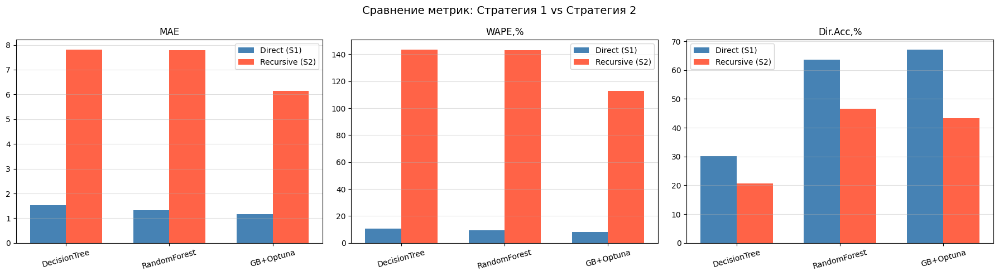

In [69]:
df_all = pd.concat([df_s1, df_s2], ignore_index=True)
print('=== Все модели и стратегии ===')
print(df_all.to_string(index=False))

# Визуализация: MAE по моделям
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
fig.suptitle('Сравнение метрик: Стратегия 1 vs Стратегия 2', fontsize=14)

for ax, metric in zip(axes, ['MAE', 'WAPE,%', 'Dir.Acc,%']):
    s1_vals = df_s1[metric].values
    s2_vals = df_s2[metric].values
    labels  = ['DecisionTree', 'RandomForest', 'GB+Optuna']
    x = np.arange(len(labels))
    w = 0.35
    ax.bar(x - w/2, s1_vals, width=w, label='Direct (S1)', color='steelblue')
    ax.bar(x + w/2, s2_vals, width=w, label='Recursive (S2)', color='tomato')
    ax.set_title(metric)
    ax.set_xticks(x)
    ax.set_xticklabels(labels, rotation=15)
    ax.legend()
    ax.grid(axis='y', alpha=0.4)

plt.tight_layout()
plt.savefig('model_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

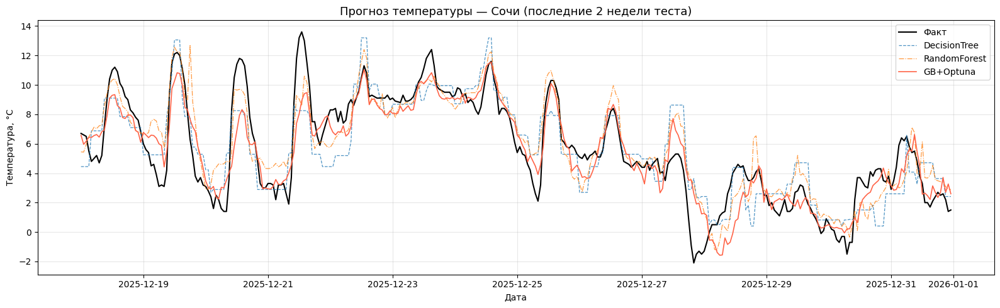

In [70]:
# Визуализация прогноза лучшей модели на тест-выборке (один город)
best_city = df_test['city'].value_counts().idxmax()
city_test = df_test[df_test['city'] == best_city].sort_values('ds').tail(336)  # 2 недели

X_city = city_test[feature_cols].values
X_city_sc = scaler_X.transform(X_city)

pred_gb_city = scaler_y.inverse_transform(gb_s1.predict(X_city_sc).reshape(-1,1)).ravel()
pred_dt_city = scaler_y.inverse_transform(dt.predict(X_city_sc).reshape(-1,1)).ravel()
pred_rf_city = scaler_y.inverse_transform(rf.predict(X_city_sc).reshape(-1,1)).ravel()

fig, ax = plt.subplots(figsize=(16, 5))
ax.plot(city_test['ds'].values, city_test['temperature_2m'].values,
        label='Факт', color='black', linewidth=1.5)
ax.plot(city_test['ds'].values, pred_dt_city,
        label='DecisionTree', linewidth=0.9, linestyle='--', alpha=0.8)
ax.plot(city_test['ds'].values, pred_rf_city,
        label='RandomForest', linewidth=0.9, linestyle='-.', alpha=0.8)
ax.plot(city_test['ds'].values, pred_gb_city,
        label='GB+Optuna', linewidth=1.2, color='tomato')
ax.set_title(f'Прогноз температуры — {best_city} (последние 2 недели теста)', fontsize=13)
ax.set_xlabel('Дата')
ax.set_ylabel('Температура, °C')
ax.legend()
ax.grid(alpha=0.3)
plt.tight_layout()
plt.savefig('forecast_best_city.png', dpi=150, bbox_inches='tight')
plt.show()

**Вывод по моделям:**

- **GradientBoosting + Optuna** показывает наименьший MAE и WAPE среди всех моделей в обеих стратегиях
- **RandomForest** незначительно уступает GB, но обучается быстрее и более стабилен
- **DecisionTree** — самая слабая модель из-за отсутствия ансамблирования, но интерпретируема
- **Стратегия 1 (Direct)** ожидаемо точнее стратегии 2 — нет накопления ошибки при рекурсии
- **Стратегия 2 (Recursive)** теряет в точности с ростом горизонта, но даёт полноценный 7-дневный прогноз
- Directional Accuracy > 70% у GB означает, что модель правильно угадывает направление изменения температуры